<H4>Installations and imports</H4>

In [112]:
!pip3 install --upgrade 'google-cloud-bigquery[pandas]' --user
!pip3 install --upgrade pip --user
!pip3 install scikit-learn
!pip3 install google-cloud-bigquery-storage
!pip3 install matplotlib
!pip3 install kneed
!pip3 install tensorflow
!pip3 install keras
!pip3 install seaborn 
%load_ext google.cloud.bigquery


import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
%matplotlib inline


from google.cloud import bigquery
from keras.layers import Input,Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers

from scipy import stats 

import joblib


import seaborn as sns
sns.set(color_codes = True)

from datetime import datetime

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Defaulting to user installation because normal site-packages is not writeable
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Defaulting to user installation because normal site-packages is not writeable
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid t

<h2>The approach </h2> We approach the data using an unsupervised learning method, specifically LSTM neural network with Autoencoder architecture, that is implemented in Python using Keras.

We decided to use LSTM (i.e., Long Short Term Memory model), an artificial recurrent neural network (RNN). This network is based on the basic structure of RNNs, which are designed to handle sequential data, where the output from the previous step is fed as input to the current step. LSTM is an improved version of the vanilla RNN, and has three different “memory” gates: forget gate, input gate and output gate. The forget gate controls what information in the cell state to forget, given new information that entered from the input gate. Our data is a time series (with revision numbers acting as the timestamps) so LSTM is a good fit, thus, it was chosen as a promising approach.

<H2>Neural Network Model (LSTM autoencoder) </H2> </n>We will use an autoencoder neural network architecture for this anomaly detection model. The way this works is that the model takes the training data, compresses it to its core features and then learns how to reconstruct that same data. This way the model learns what is 'normal' data and makes assumptions on how it will reconstruct the newer data coming in that it hasn't trained on. When it encounters data that varies from the norm, it will have a higher level of reconstruction error, thus identifying possible anomalous points. <br></br>Below we define the autoencoder model. It is made up of 7 layers, including an input and an output layer. The first two layers conduct the compressed representation of the data; the encoder. The third layer, the repeat vector layer distributes this compressed vector across the time steps of the decoder.<br></br> When we instantiate the model, we use 'Adam' as the optimiser of the neural network and 'MAE' to calculate the loss function. Adam is a replacement optimisation for stochastic gradient descent which combines AdaGrad and RMSProp algorithms to create an algorithm that can handle sparse gradients on noisy problems. Mae (Mean absolute error) is a loss function used for regression models. It is the sum of absolute differences between the target and the predicted variables. This means taht it measures the average magnitude of the errors in a set of predictions without considering directions. 

In [113]:
def autoencoder_model(X):
    inputs = Input(shape = (X.shape[1],X.shape[2]))
    L1 = LSTM(16,activation = 'relu', return_sequences = True,kernel_regularizer = regularizers.l2(0.00))(inputs)
    L2 = LSTM(4,activation ='relu',return_sequences = False)(L1)
    L3 = RepeatVector(X.shape[1])(L2)
    L4 = LSTM(4,activation ='relu',return_sequences = True)(L3)
    L5 = LSTM(16,activation ='relu',return_sequences = True)(L4)
    output = TimeDistributed(Dense(X.shape[2]))(L5)
    model = Model(inputs = inputs, outputs = output)
    return model

The data we will be working with is currently being stored in the chromeperf-datalab bigquery project. </br>
The raw data is structured in the following way 
-revision	INTEGER	 --> This is the unique revision number for the build	
- value	FLOAT	 --> This is generally the mean of sample_values	
- std_error	FLOAT	 --> Standard error for value	
- timestamp	TIMESTAMP	 --> This is the time the data was uploaded to the dashboard	
- master	STRING --> Project	
- bot	STRING --> Platform	
- test	STRING -->Measurement data with the added information about the ---- platform and the project --> Project/platform/measurement	
- properties	STRING --> Properties of the test	 
- sample_values	FLOAT -->An array of values from multiple iterations of the specific story.	
- measurement	STRING	 --> The exact metric being measured. The structure of the measurement usually is:
</br>benchmark/metric/label/story	
metrics have several label groups and each of those labels have individual stories to test.	

In [114]:
bigquery_client = bigquery.Client(project='chromeperf-datalab')
#can change this later to be arrays so we can loop through them for multiple different combinations of metric, bot and platform
case = "ChromiumPerf","linux-perf","system_health.common_desktop/timeToFirstPaint/%/%"

In [115]:

sql = """
SELECT SPLIT(measurement, '/')[SAFE_OFFSET(2)] label, revision, value, std_error, sample_values
FROM `chromeperf.chromeperf_dashboard_data.rows`
WHERE DATE(timestamp) >= DATE_SUB(CURRENT_DATE(), INTERVAL 30 DAY)
AND master = "{MASTER}"
AND bot = "{BOT}"
AND measurement LIKE "{METRIC}"
ORDER BY revision ASC 
"""

def fetch_sample_data(case):
  MASTER, BOT, METRIC = case
  return bigquery_client.query(sql.format(**locals())).result().to_dataframe()

df= fetch_sample_data(case)
print(df.head(n=7))
print(type(df))

          label  revision    value  std_error      sample_values
0    load_media    840369  162.897   0.000000          [162.897]
1     load_news    840369  155.651   0.000000          [155.651]
2    load_games    840369  164.748   0.000000          [164.748]
3     load_news    840369  115.467  25.079673  [97.733, 133.201]
4     load_news    840369  586.383   0.000000          [586.383]
5     load_news    840369  313.084   0.000000          [313.084]
6  browse_media    840369  188.049   0.000000          [188.049]
<class 'pandas.core.frame.DataFrame'>


In [96]:
Query = """
SELECT SPLIT(measurement, '/')[SAFE_OFFSET(2)] label, revision, value, std_error, sample_values
FROM `chromeperf.chromeperf_dashboard_data.rows`
WHERE DATE(timestamp) >= DATE_SUB(CURRENT_DATE(), INTERVAL 30 DAY)
AND master="ChromiumPerf"
AND bot="linux-perf"
AND measurement LIKE "system_health.common_desktop/timeToFirstPaint/%/%"
ORDER BY revision ASC 
"""
query_job = bigquery_client.query(Query)
df = query_job.to_dataframe()
print(df.head(n=7))
print(type(df))

          label  revision    value  std_error      sample_values
0    load_media    840369  162.897   0.000000          [162.897]
1     load_news    840369  155.651   0.000000          [155.651]
2    load_games    840369  164.748   0.000000          [164.748]
3     load_news    840369  115.467  25.079673  [97.733, 133.201]
4     load_news    840369  586.383   0.000000          [586.383]
5     load_news    840369  313.084   0.000000          [313.084]
6  browse_media    840369  188.049   0.000000          [188.049]
<class 'pandas.core.frame.DataFrame'>


The query determines the data that we will be pulling from bigquery. For this POC we will be analysing the timeToFirstPaint metric over the last 30 days. We have pulled out labels from the measurement field.

<H2>Data Preprocessing</H2> </N> Current approach involves making a nested dictionary where each label has a dictionary of revision numbers that have the collected sample values across every instance of that label in that revision. This wil be further refined to make use of pandas and dataframe reshaping.

In [116]:
label_group = df.groupby(['label','revision'])['sample_values'].apply(pd.Series.to_numpy)
groups = tuple(zip(*label_group.keys()))[0]
label_names = np.unique(groups)

In [117]:
label_stats = {}
for label in label_names:
    revisions_dictionary = label_group[label]
    revisions_list = list(revisions_dictionary.keys())
    stats_dictionary = {}
    for revision in revisions_list:
        
        values = np.concatenate(revisions_dictionary[revision], axis = 0)
        median = np.median(values)
        average = np.average(values)
        std = np.std(values)
        mean = np.mean(values)
        minimum = min(values)
        maximum = max(values)
        delta = maximum-minimum
        IQR = stats.iqr(values, interpolation = 'midpoint')

        stats_dictionary[revision] = {'total': sum(values), 'median':median, 'average': average, 'standard deviation':std,'mean': mean, 'min': minimum,'max': maximum,'delta': delta, 'IQR': IQR}
    label_stats[label]=stats_dictionary

In [ ]:
print(label_stats)

<H2>Model building and training</H2>

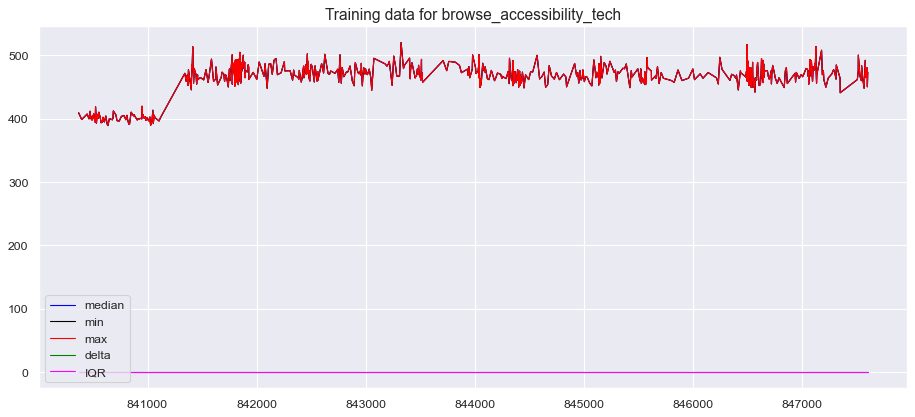

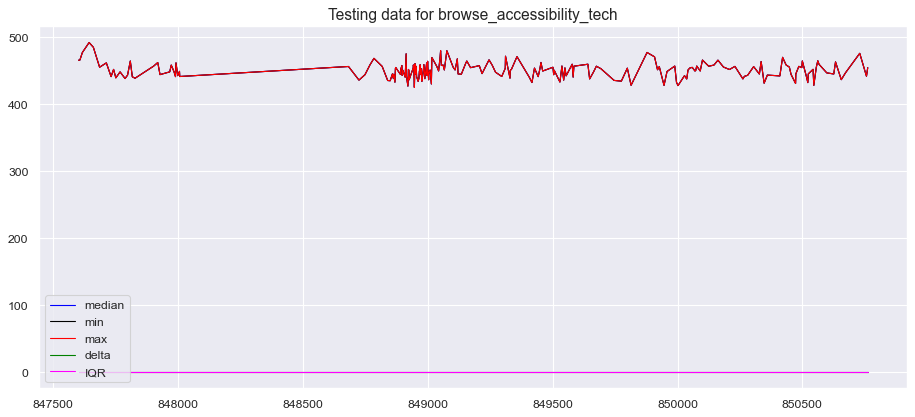

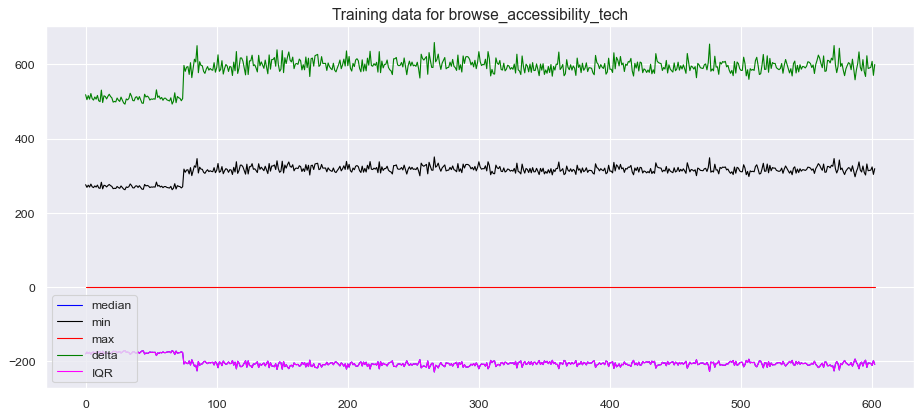

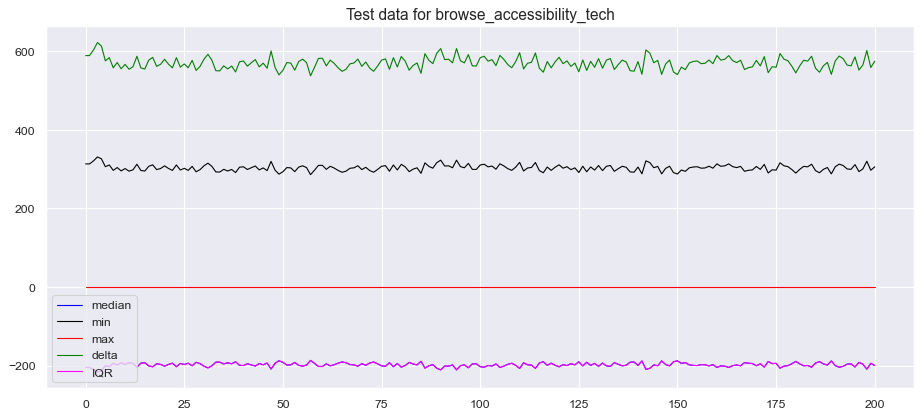

training data shape for browse_accessibility_tech (603, 1, 9)
test data shape for browse_accessibility_tech (201, 1, 9)
Model: "model_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_51 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_200 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_201 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_50 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_202 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_203 (LSTM)              (None, 1, 16)             1344      
____

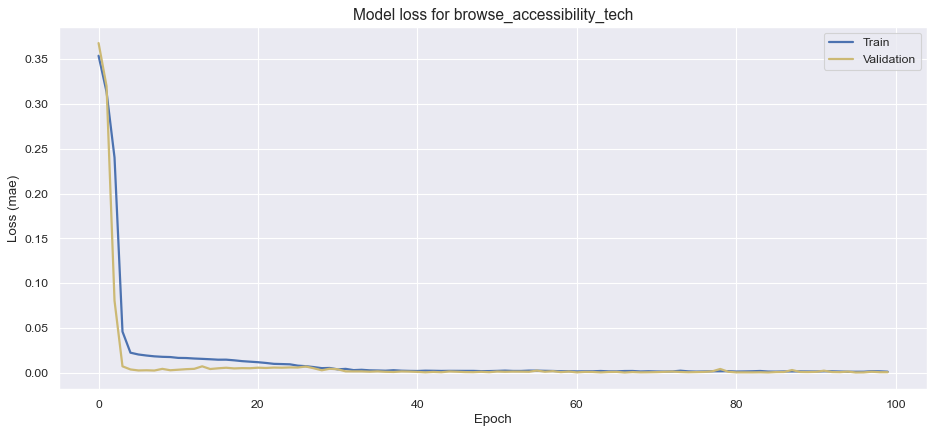

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_accessibility_tech 05/02/2021 14:55:24.h5 saved


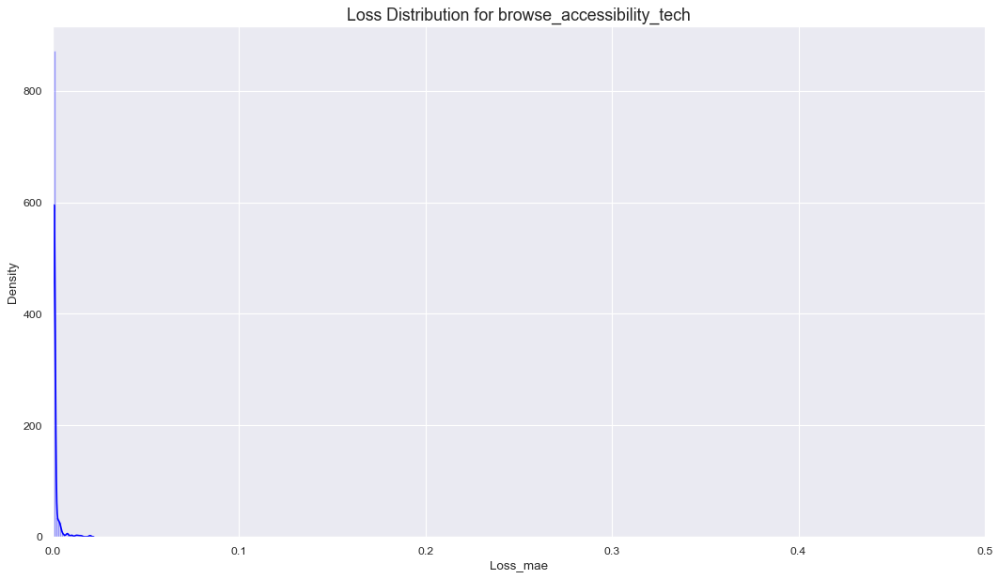

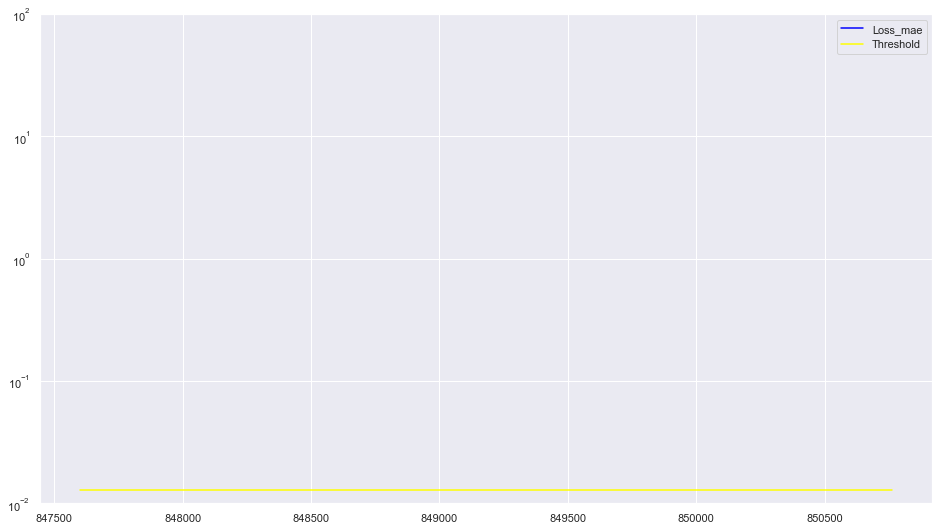

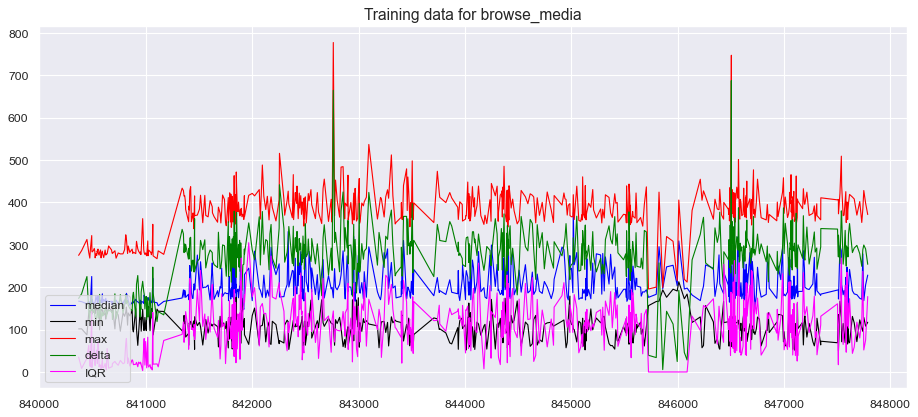

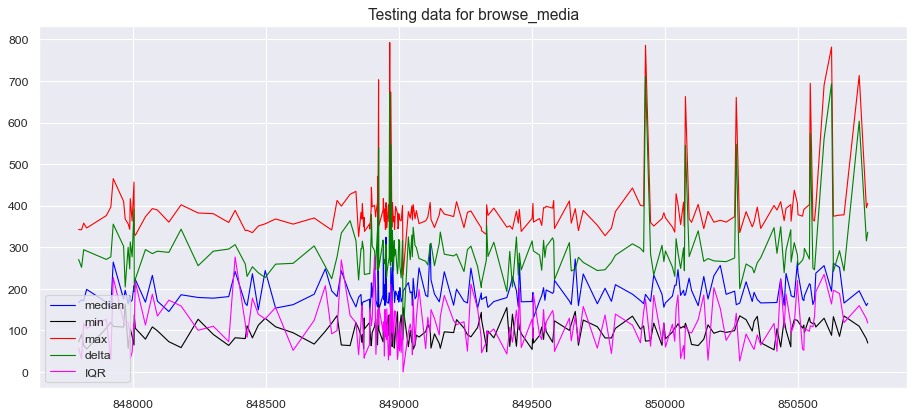

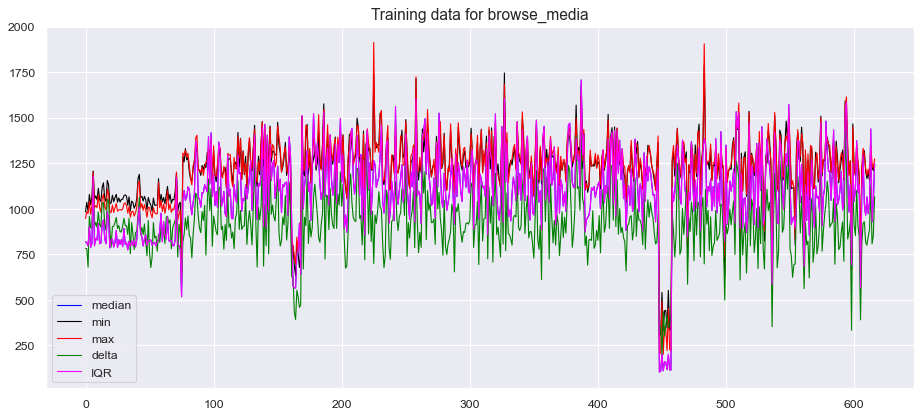

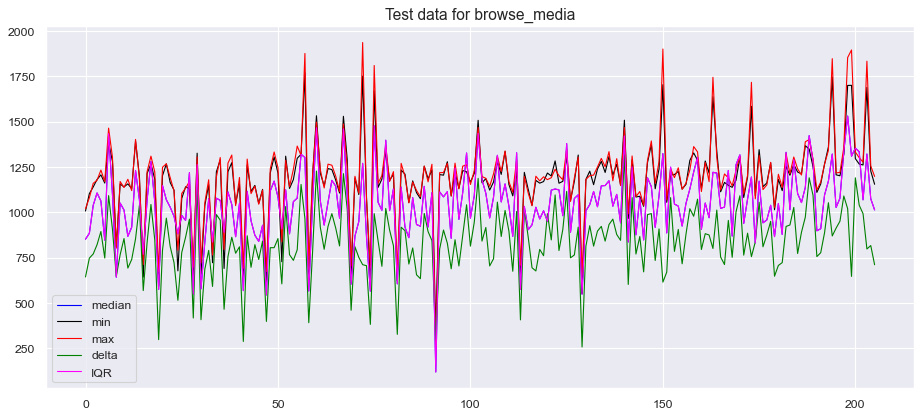

training data shape for browse_media (617, 1, 9)
test data shape for browse_media (206, 1, 9)
Model: "model_51"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_52 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_204 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_205 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_51 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_206 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_207 (LSTM)              (None, 1, 16)             1344      
______________________________

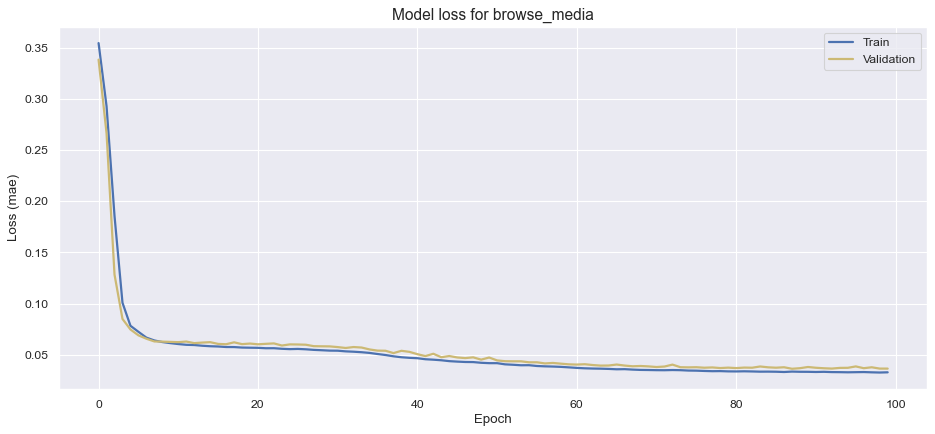

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_media 05/02/2021 14:56:02.h5 saved


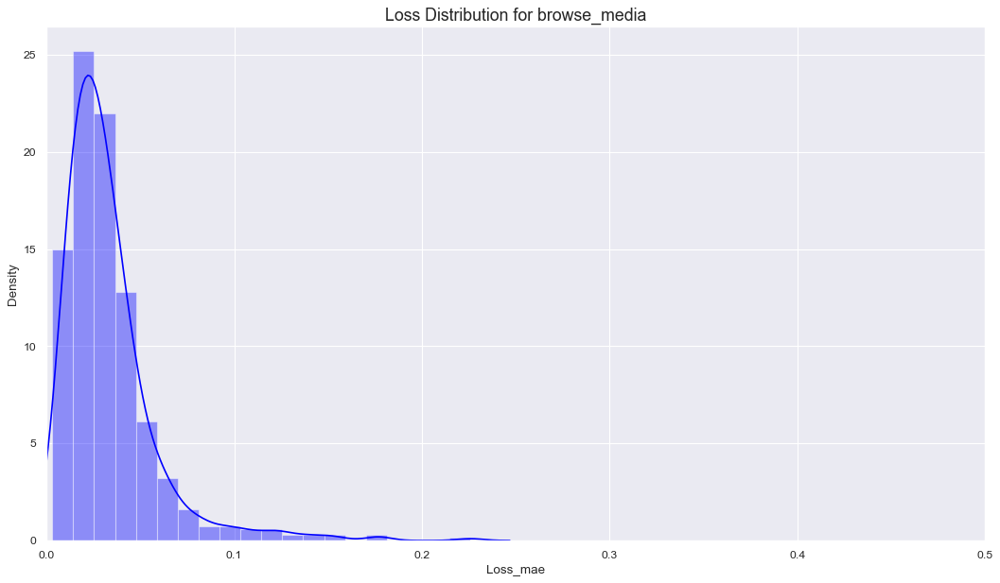

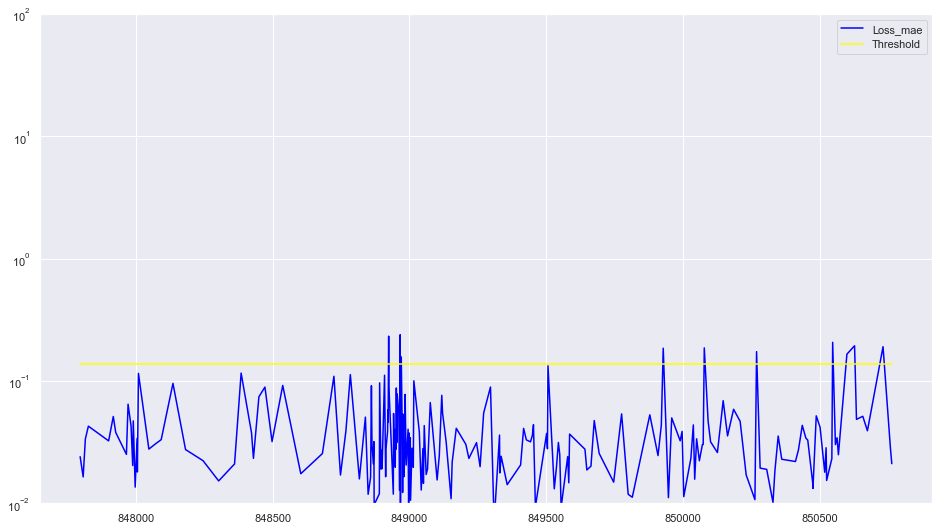

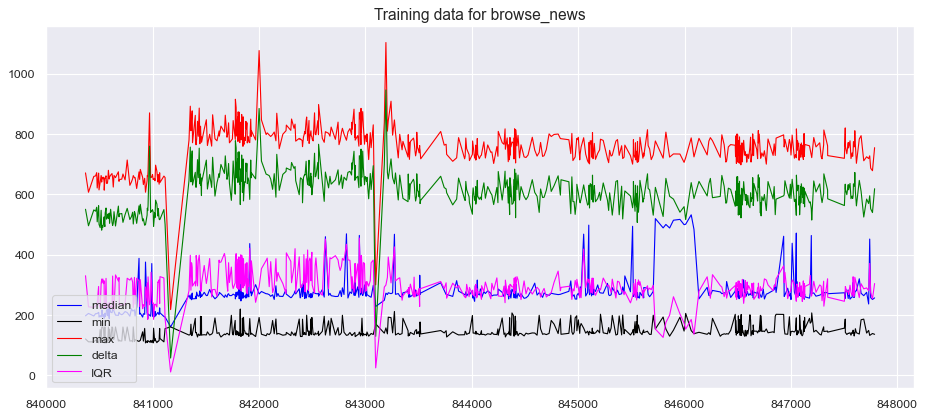

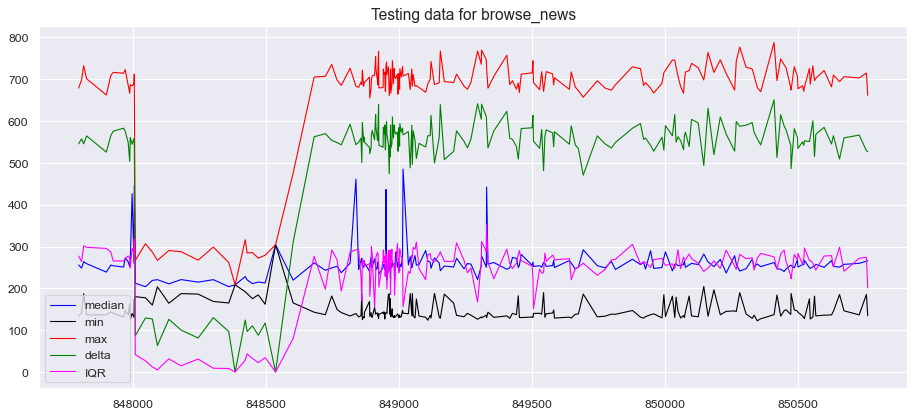

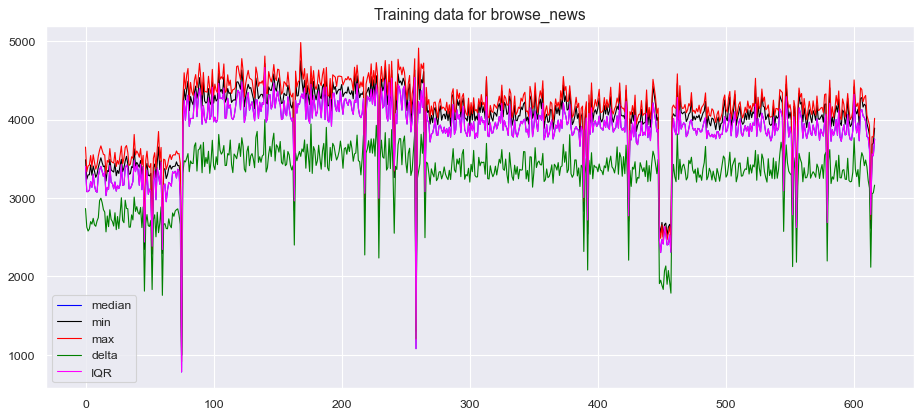

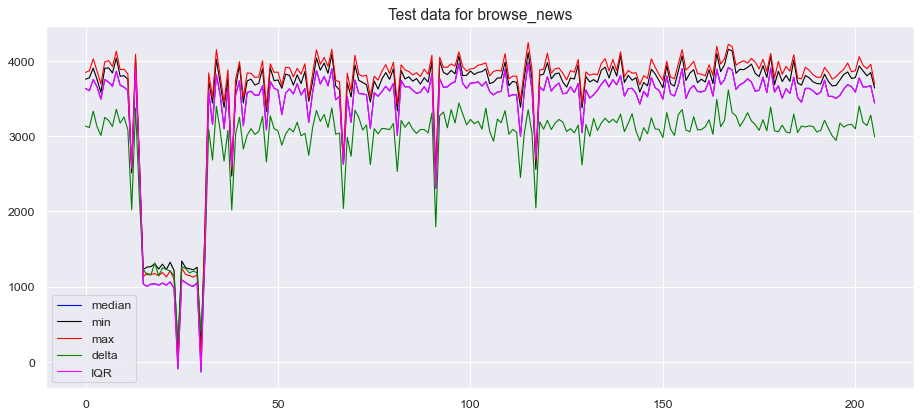

training data shape for browse_news (617, 1, 9)
test data shape for browse_news (206, 1, 9)
Model: "model_52"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_53 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_208 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_209 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_52 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_210 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_211 (LSTM)              (None, 1, 16)             1344      
________________________________

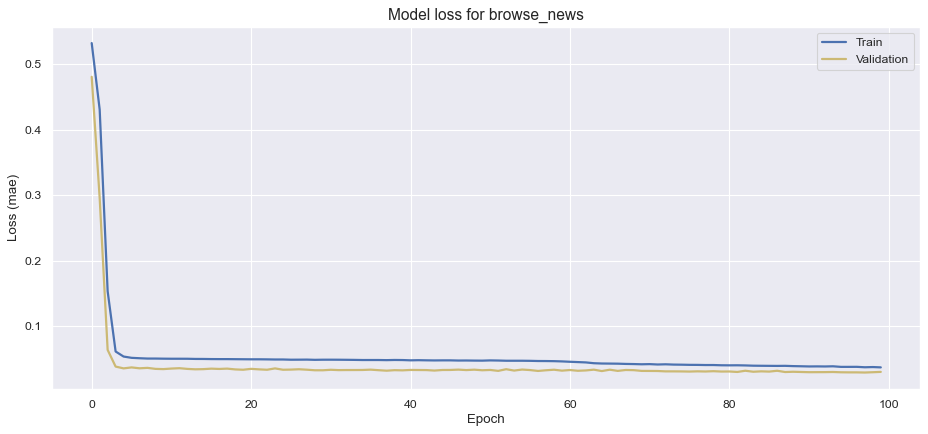

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_news 05/02/2021 14:56:29.h5 saved


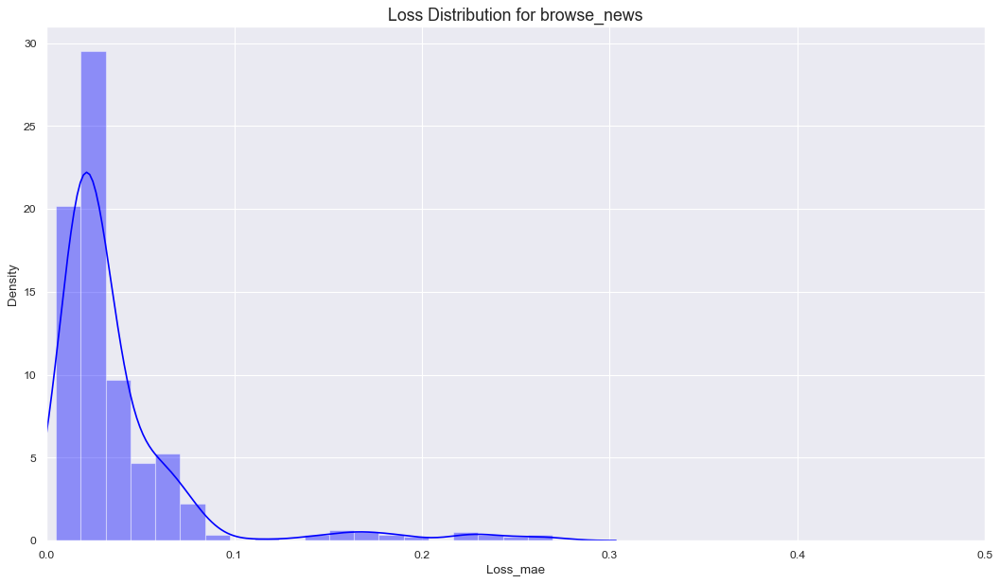

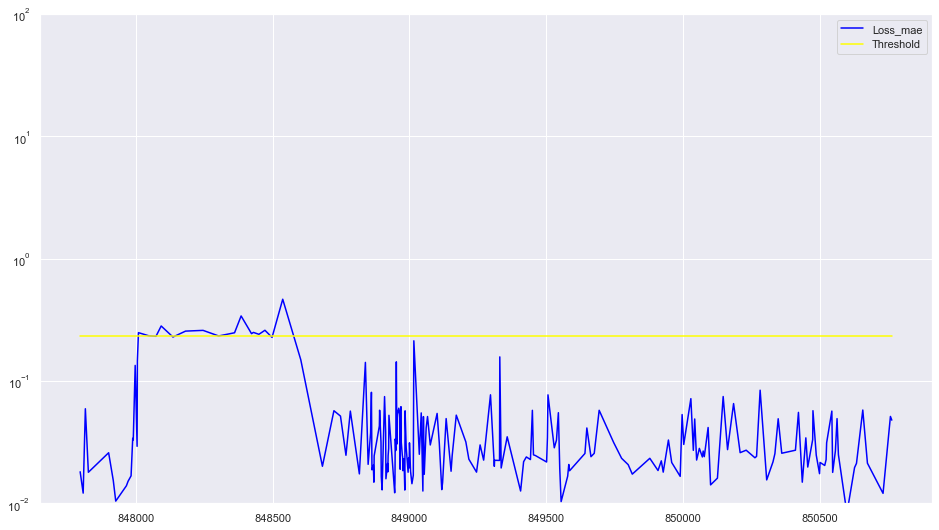

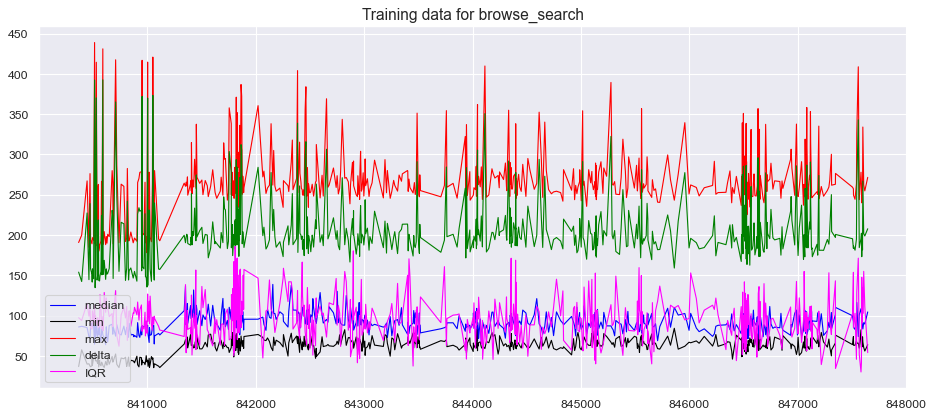

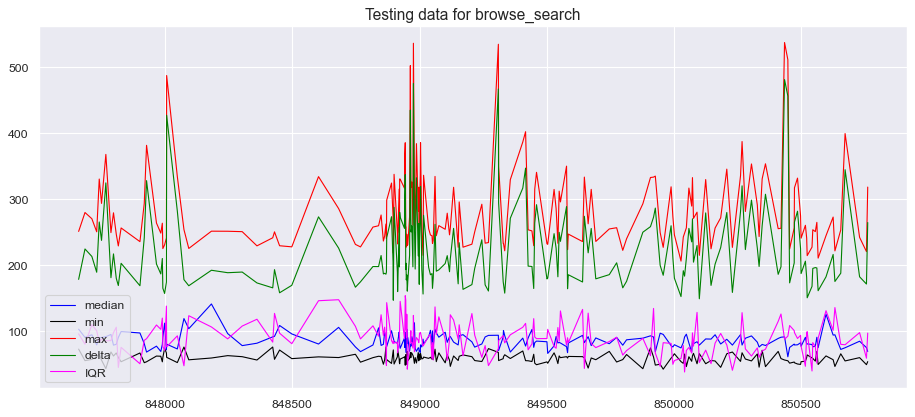

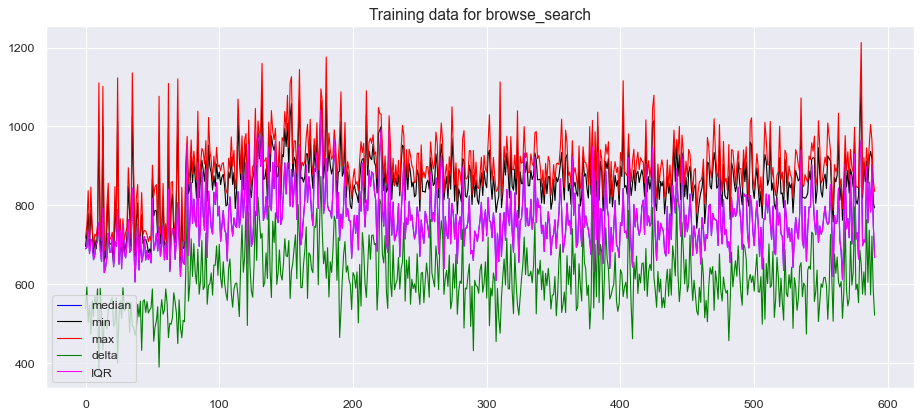

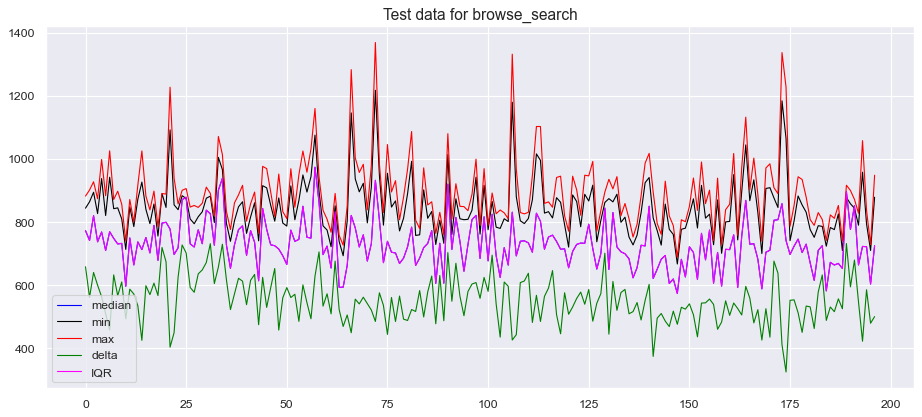

training data shape for browse_search (591, 1, 9)
test data shape for browse_search (197, 1, 9)
Model: "model_53"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_54 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_212 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_213 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_53 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_214 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_215 (LSTM)              (None, 1, 16)             1344      
____________________________

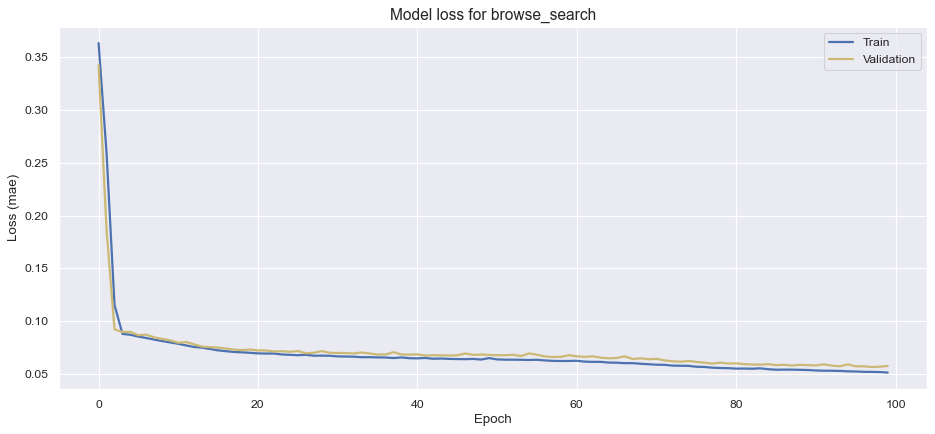

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_search 05/02/2021 14:56:56.h5 saved


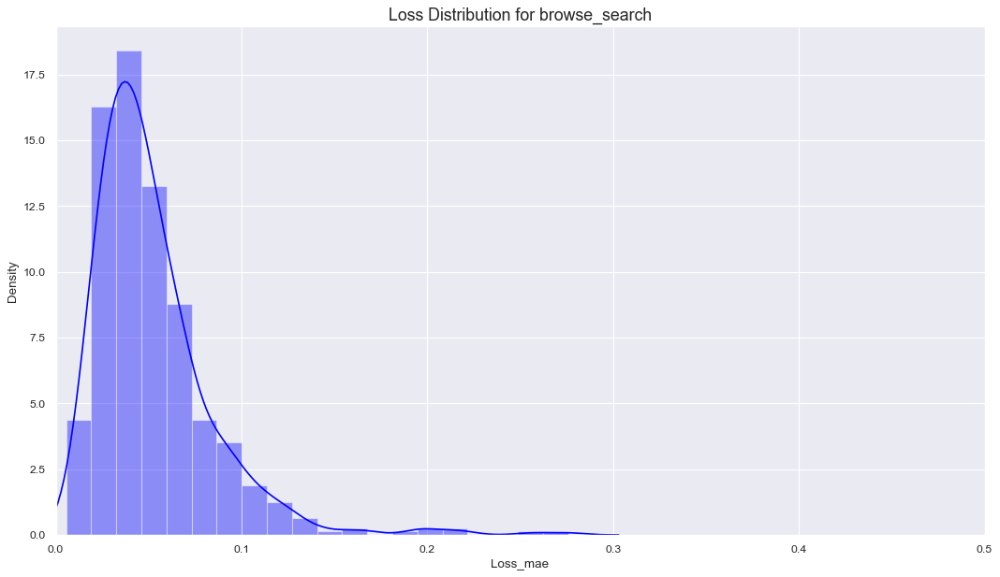

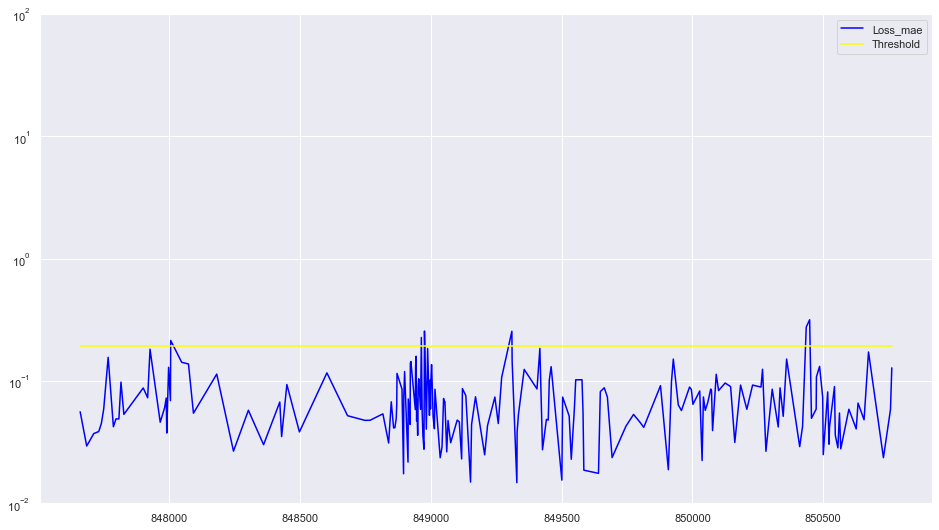

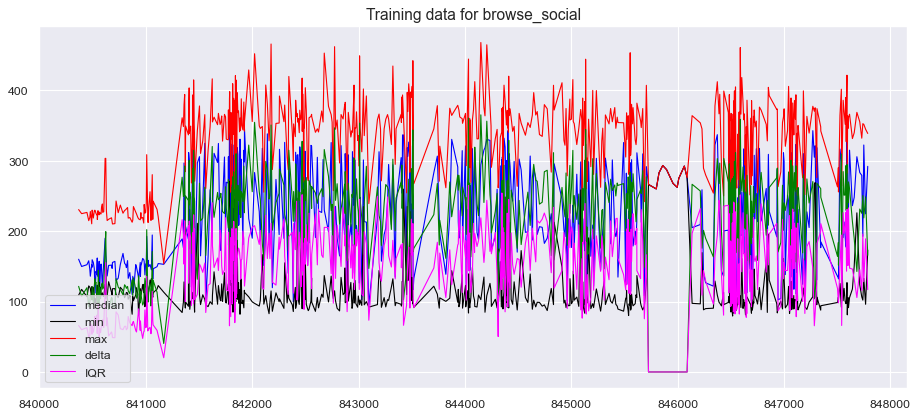

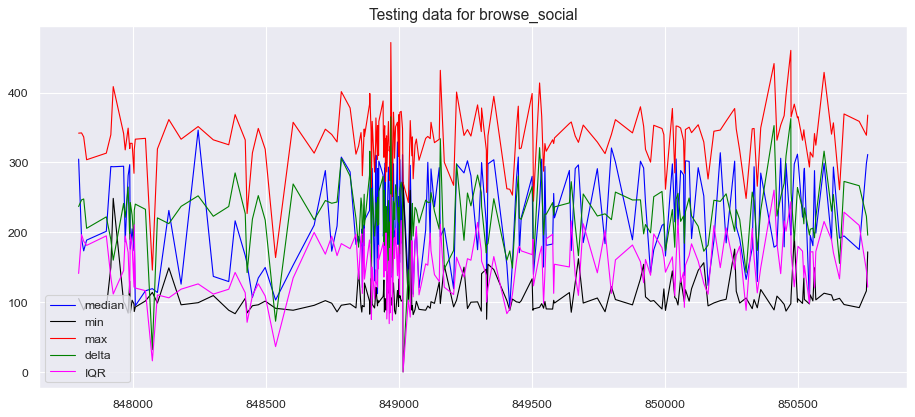

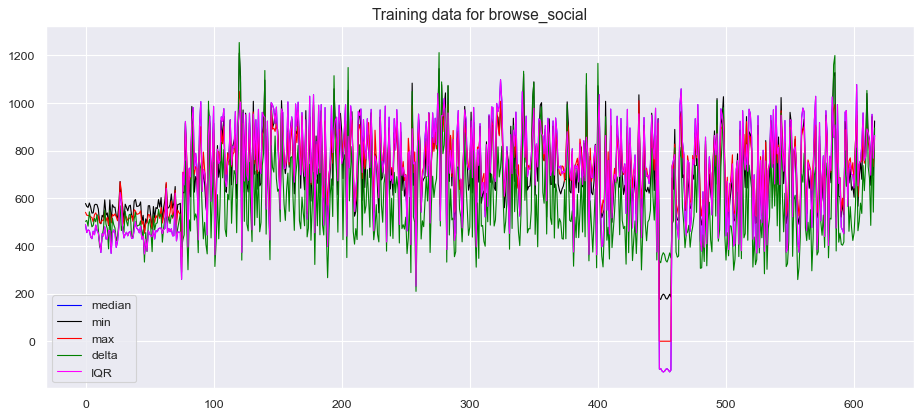

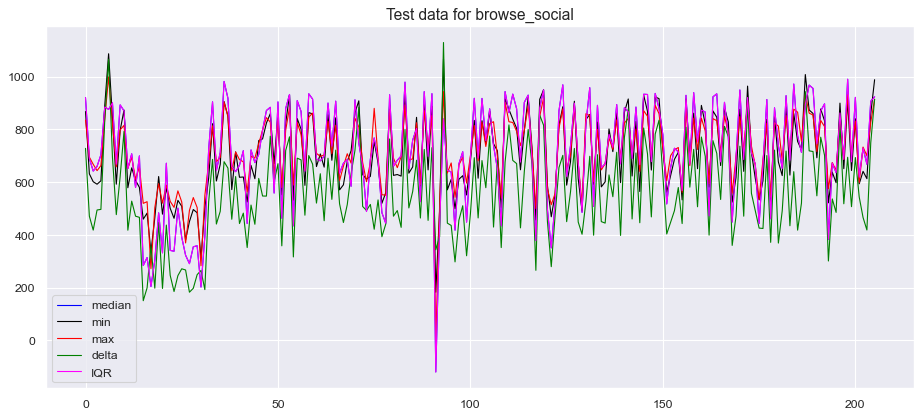

training data shape for browse_social (617, 1, 9)
test data shape for browse_social (206, 1, 9)
Model: "model_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_55 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_216 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_217 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_54 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_218 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_219 (LSTM)              (None, 1, 16)             1344      
____________________________

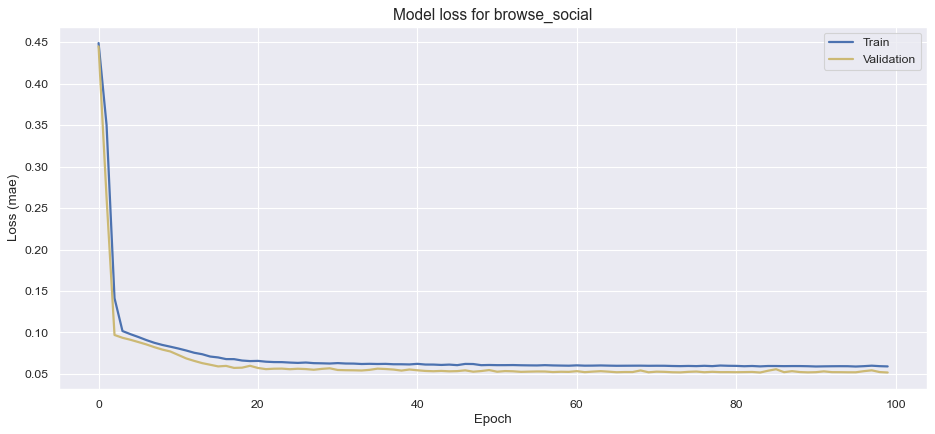

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_social 05/02/2021 14:57:25.h5 saved


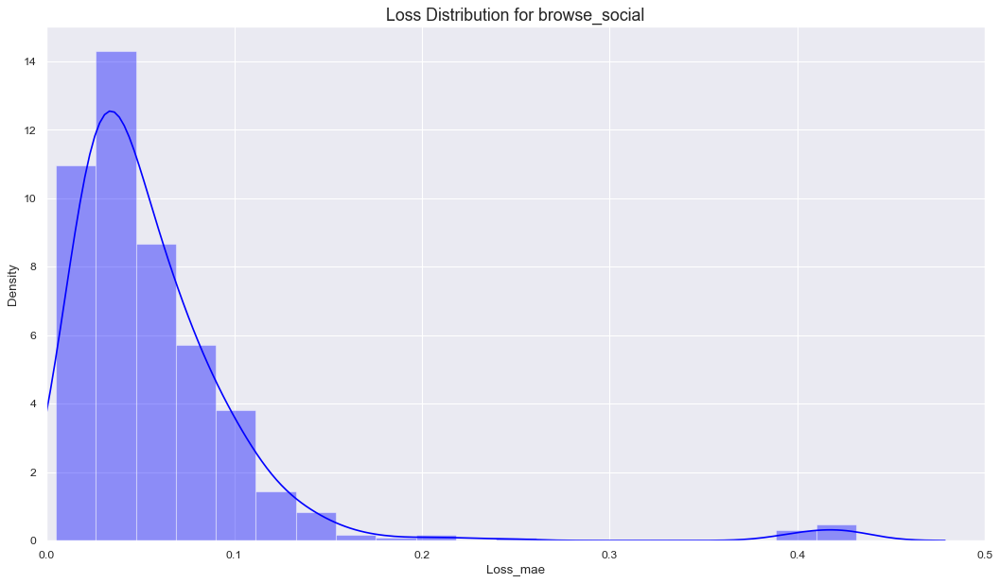

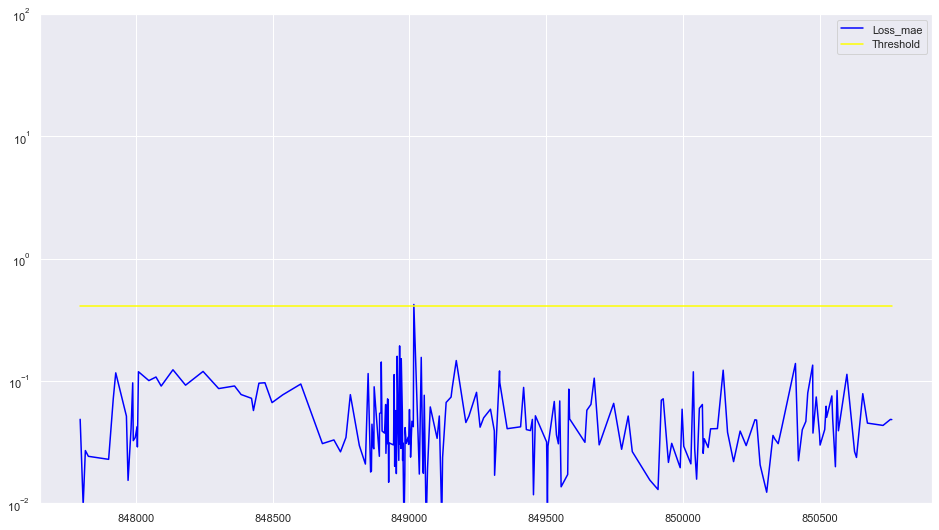

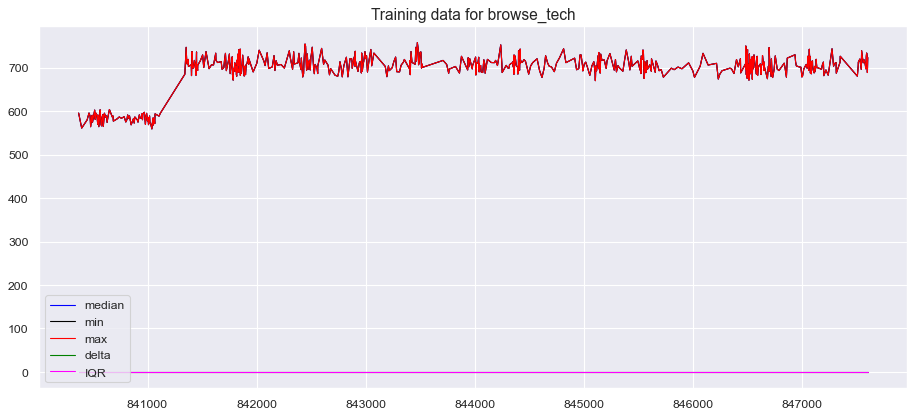

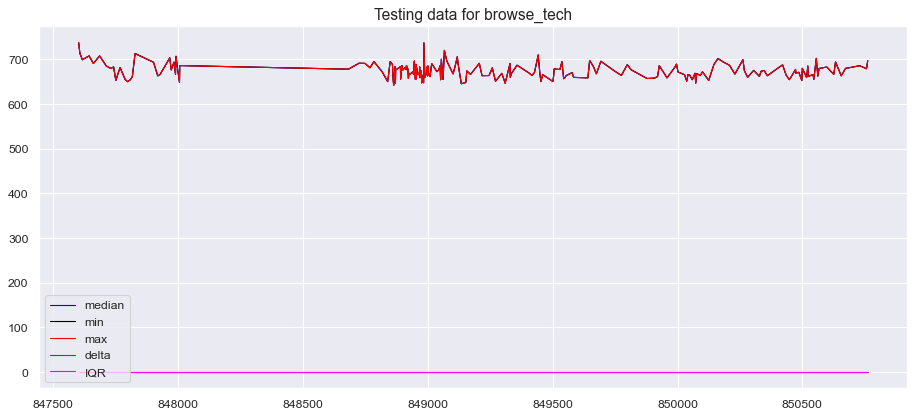

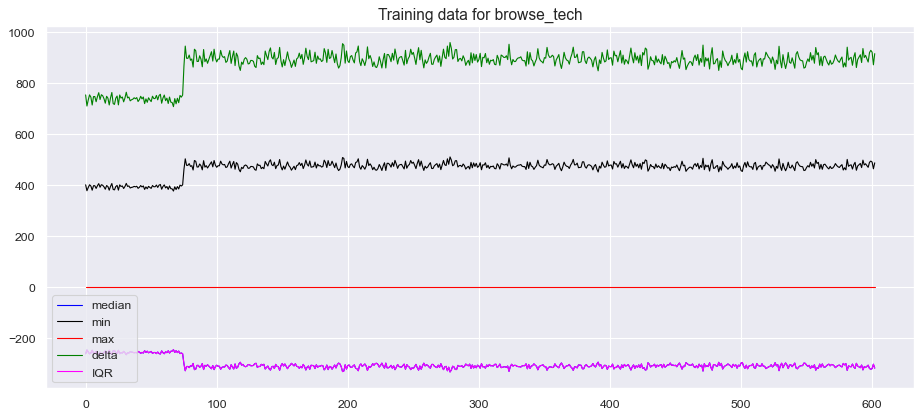

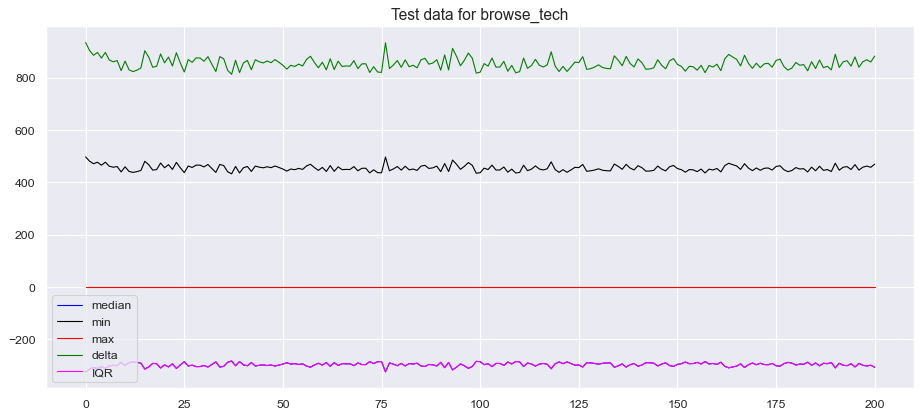

training data shape for browse_tech (603, 1, 9)
test data shape for browse_tech (201, 1, 9)
Model: "model_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_56 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_220 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_221 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_55 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_222 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_223 (LSTM)              (None, 1, 16)             1344      
________________________________

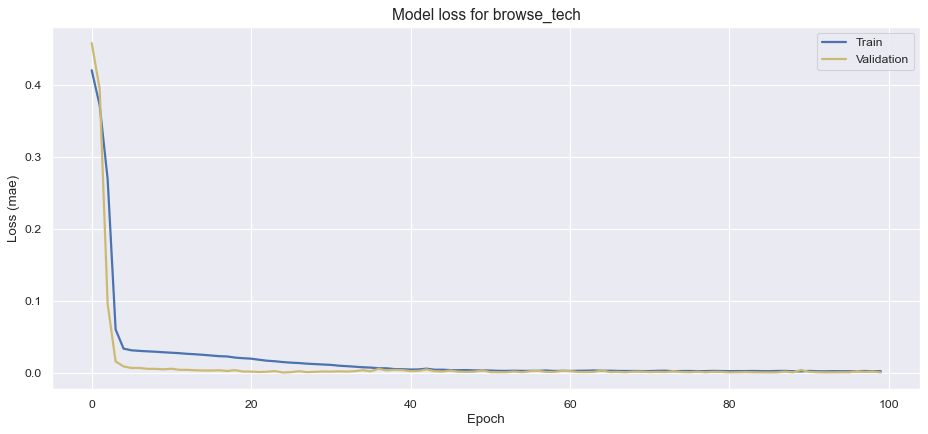

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_tech 05/02/2021 14:57:54.h5 saved


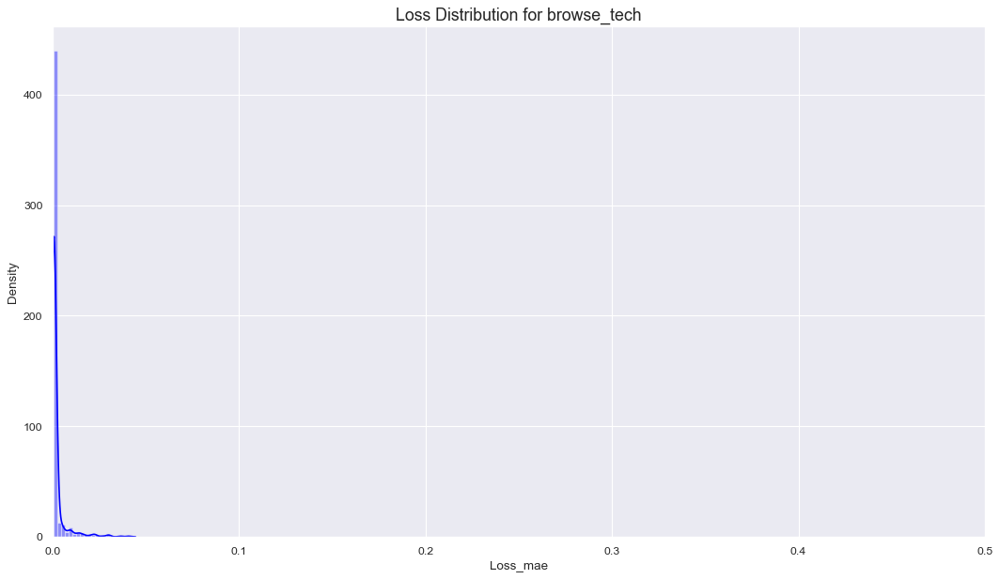

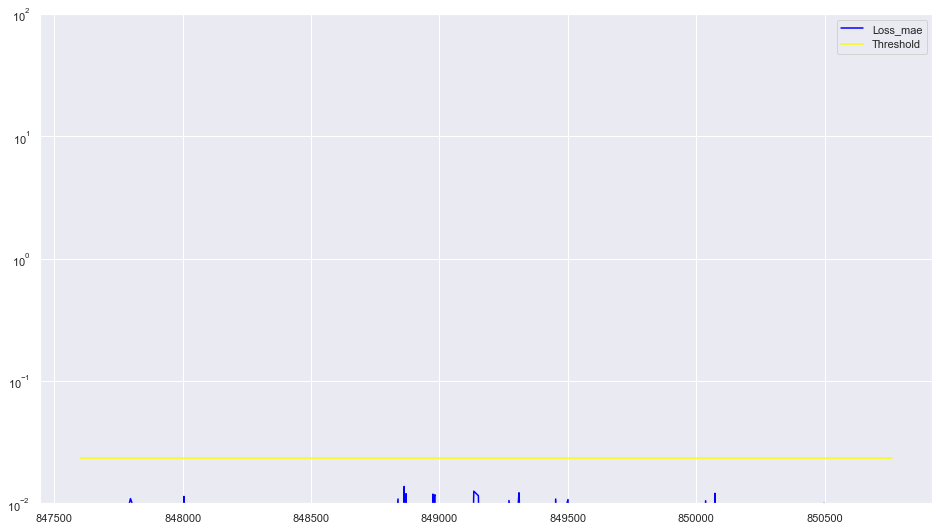

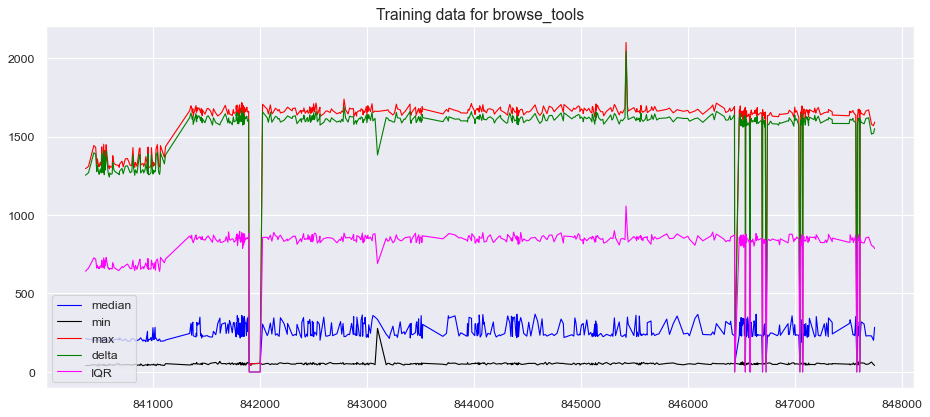

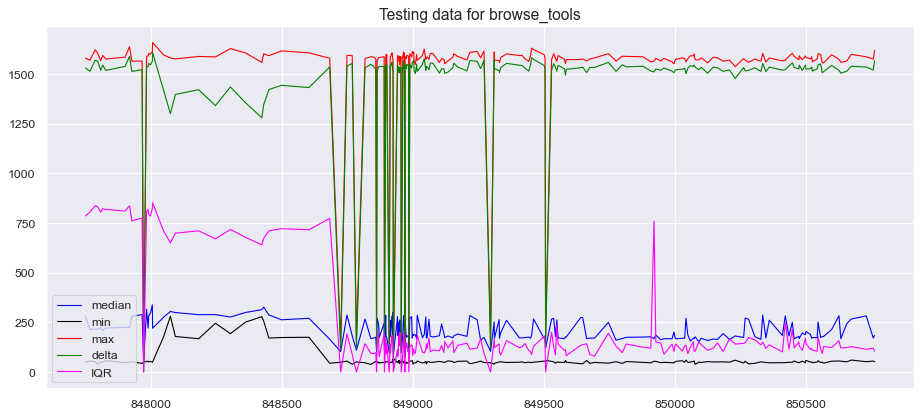

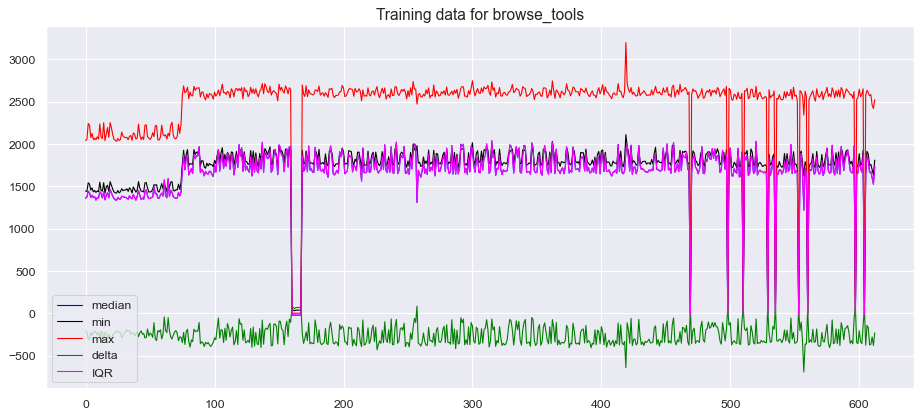

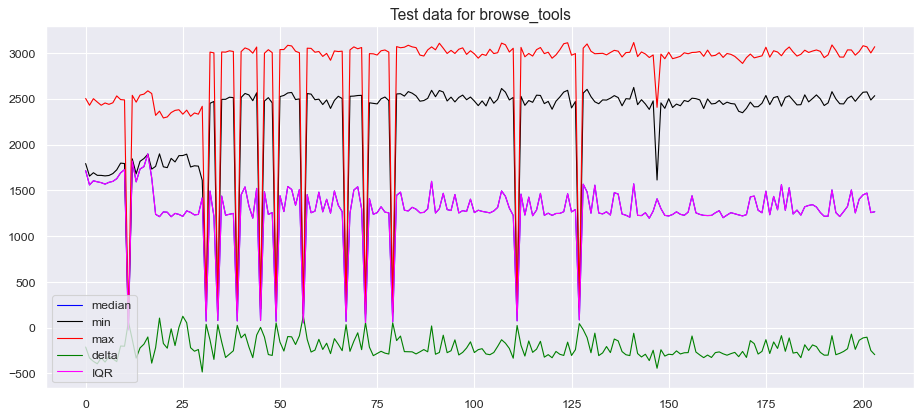

training data shape for browse_tools (613, 1, 9)
test data shape for browse_tools (204, 1, 9)
Model: "model_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_57 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_224 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_225 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_56 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_226 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_227 (LSTM)              (None, 1, 16)             1344      
______________________________

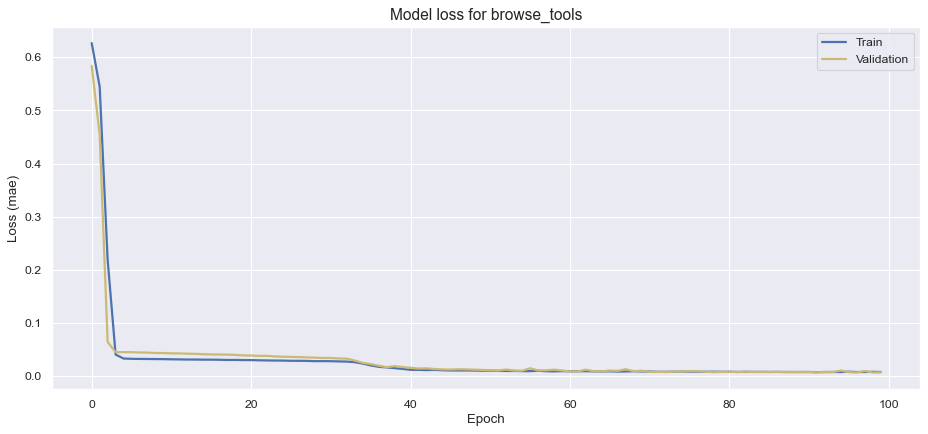

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint browse_tools 05/02/2021 14:58:22.h5 saved


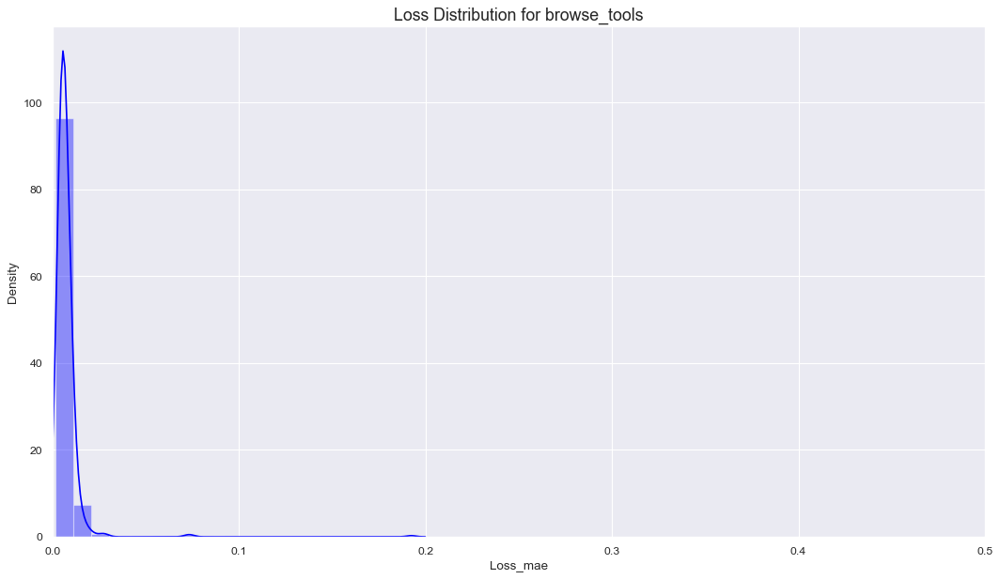

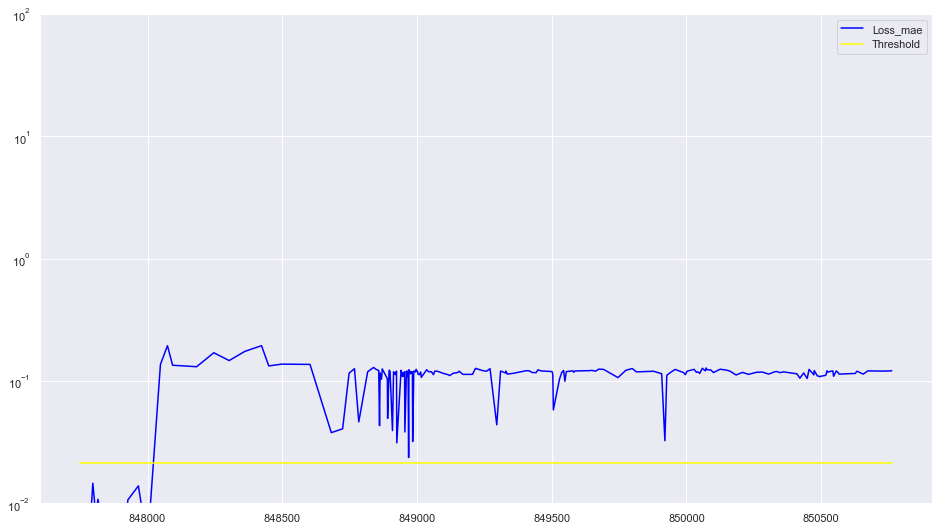

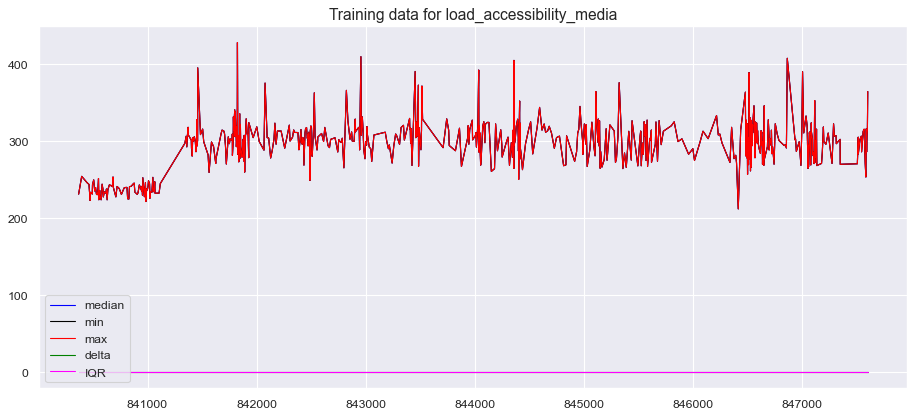

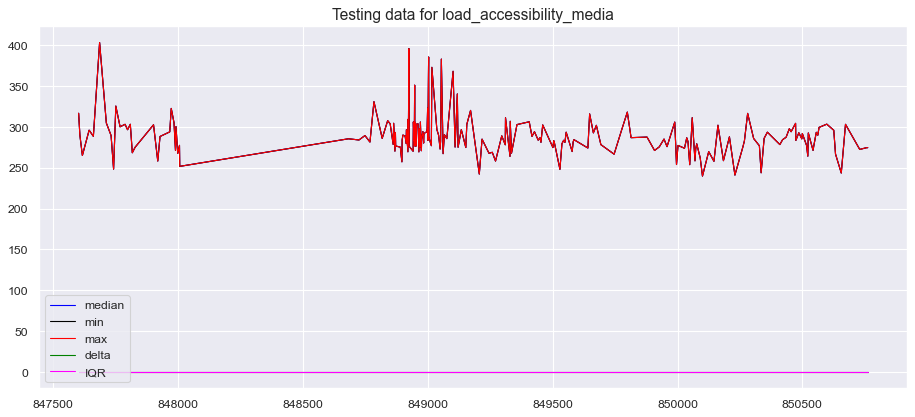

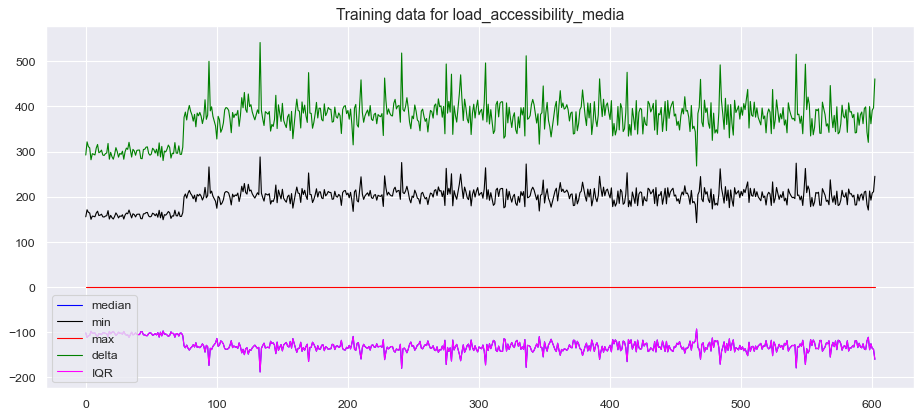

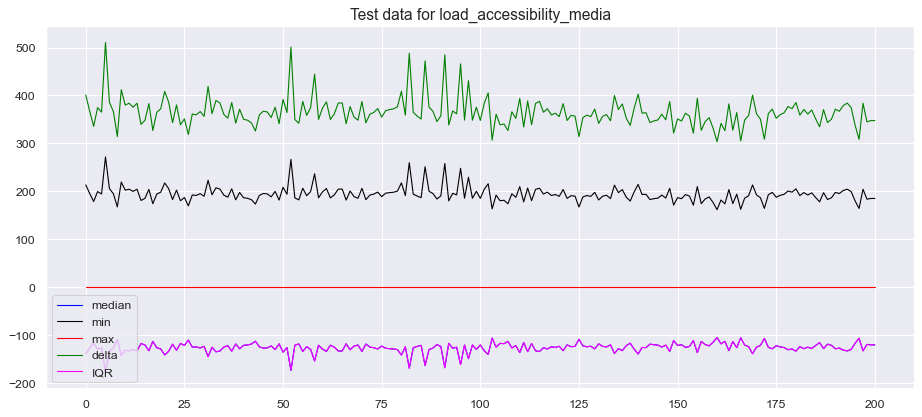

training data shape for load_accessibility_media (603, 1, 9)
test data shape for load_accessibility_media (201, 1, 9)
Model: "model_57"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_58 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_228 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_229 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_57 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_230 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_231 (LSTM)              (None, 1, 16)             1344      
______

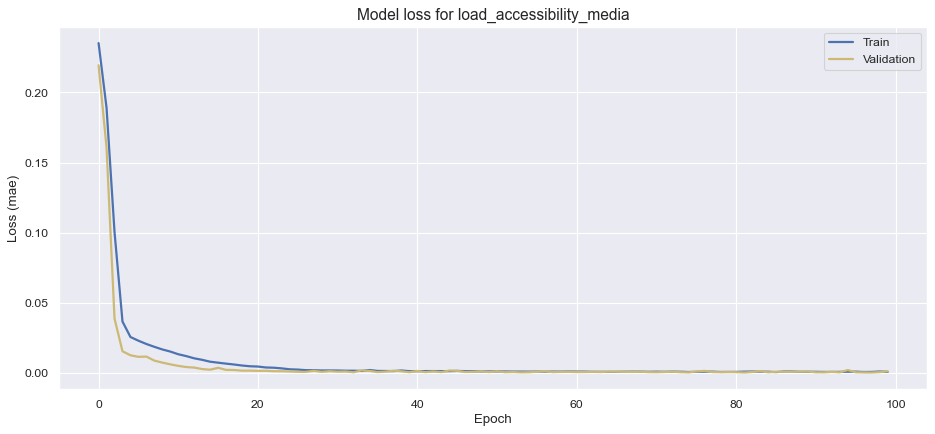

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_accessibility_media 05/02/2021 14:58:48.h5 saved


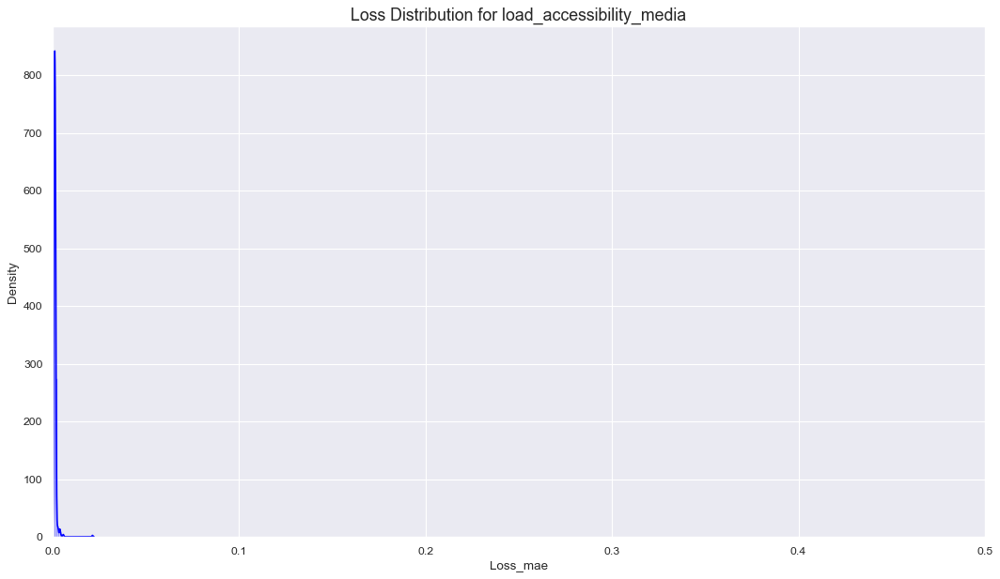

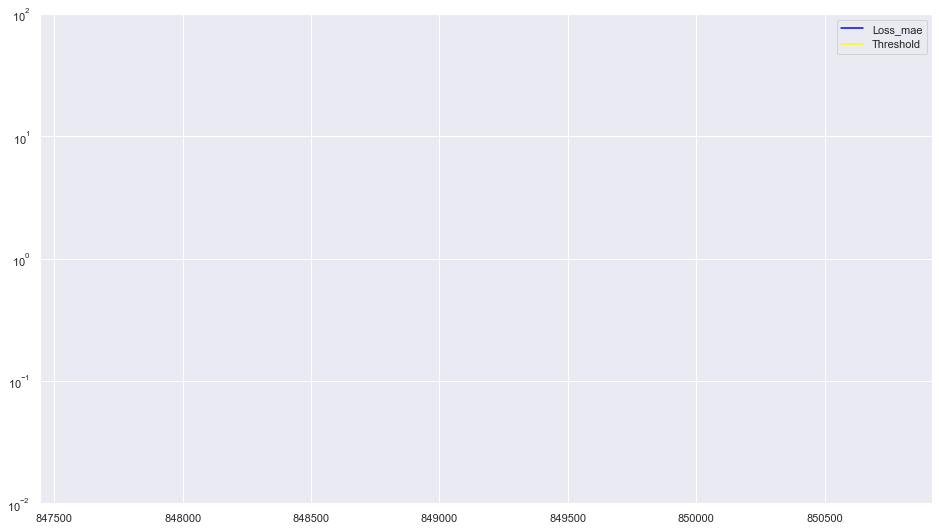

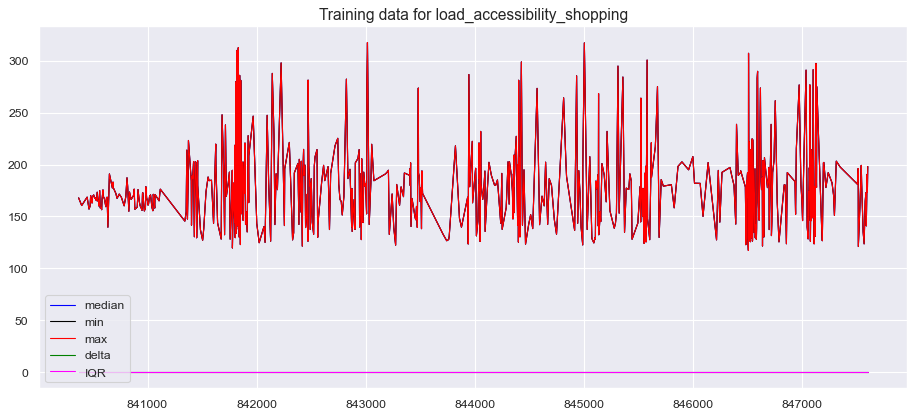

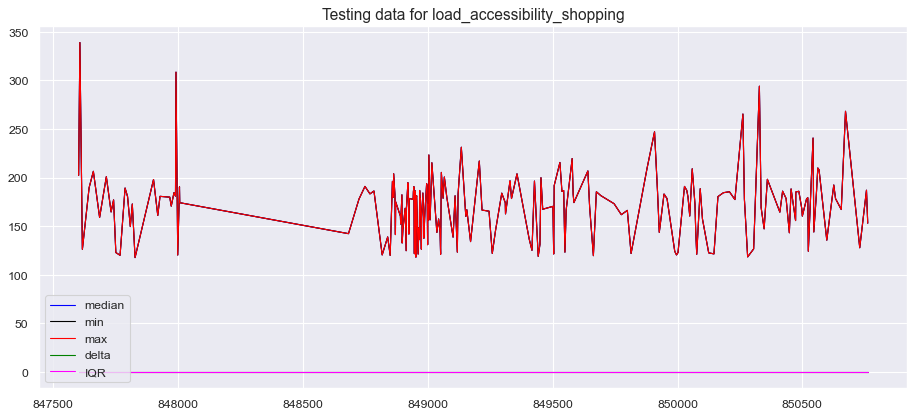

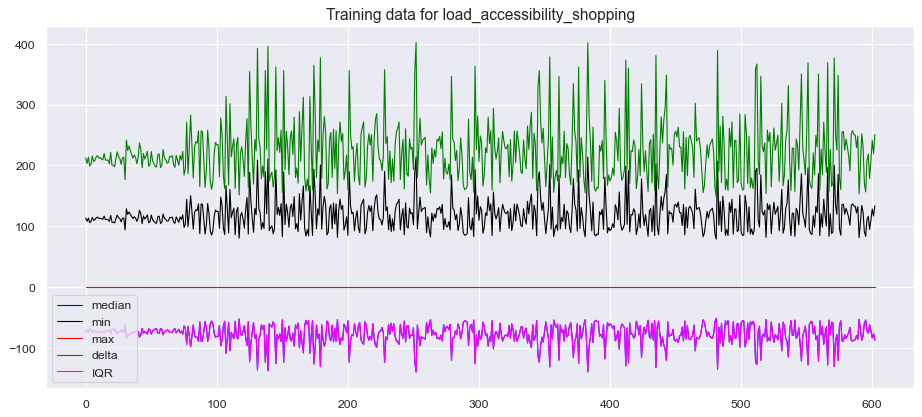

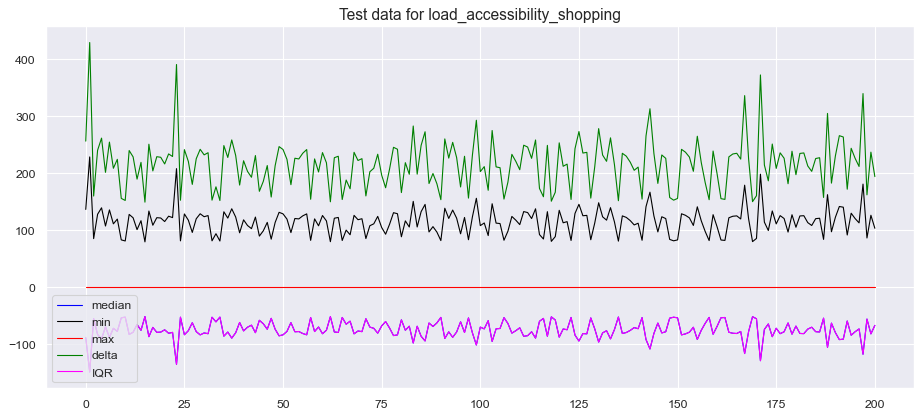

training data shape for load_accessibility_shopping (603, 1, 9)
test data shape for load_accessibility_shopping (201, 1, 9)
Model: "model_58"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_59 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_232 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_233 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_58 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_234 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_235 (LSTM)              (None, 1, 16)             1344      


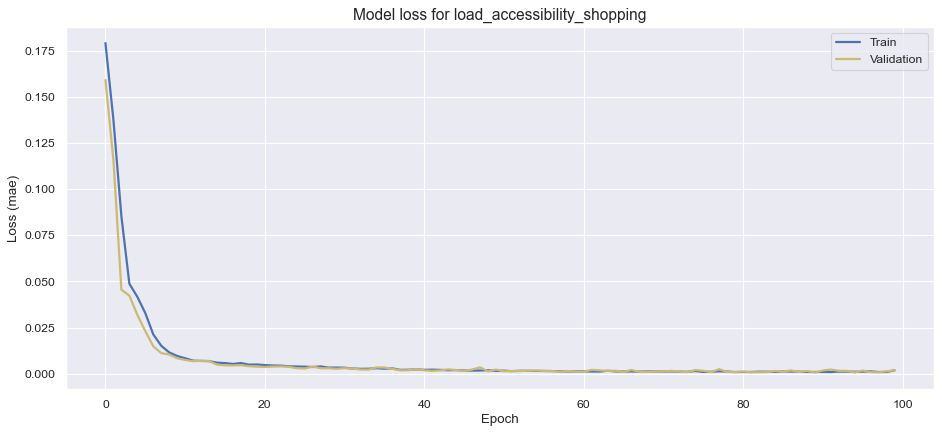

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_accessibility_shopping 05/02/2021 14:59:16.h5 saved


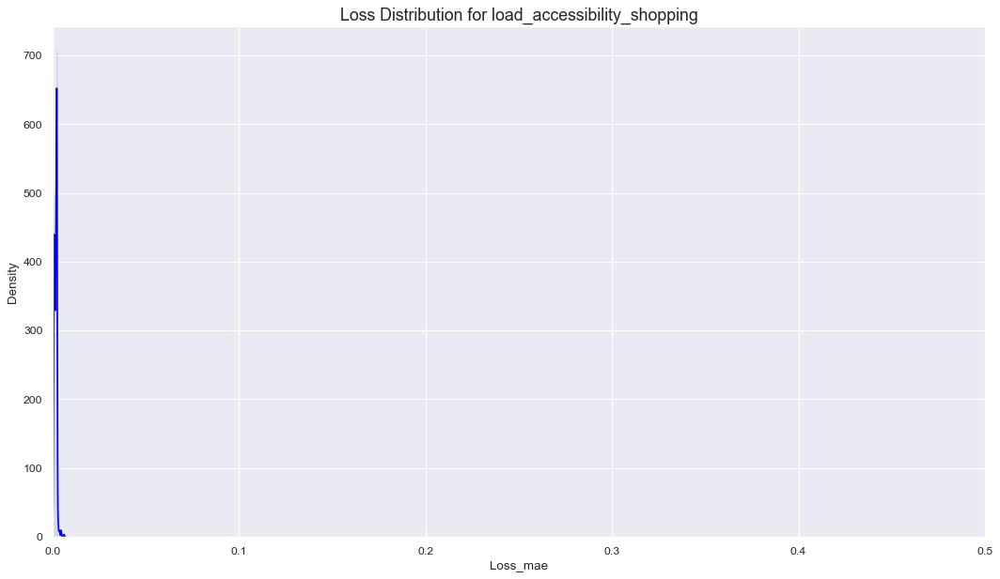

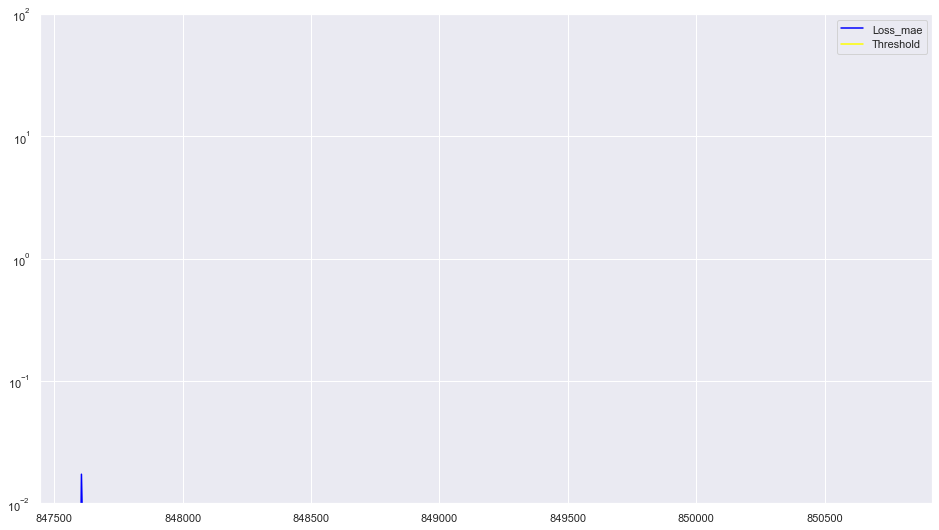

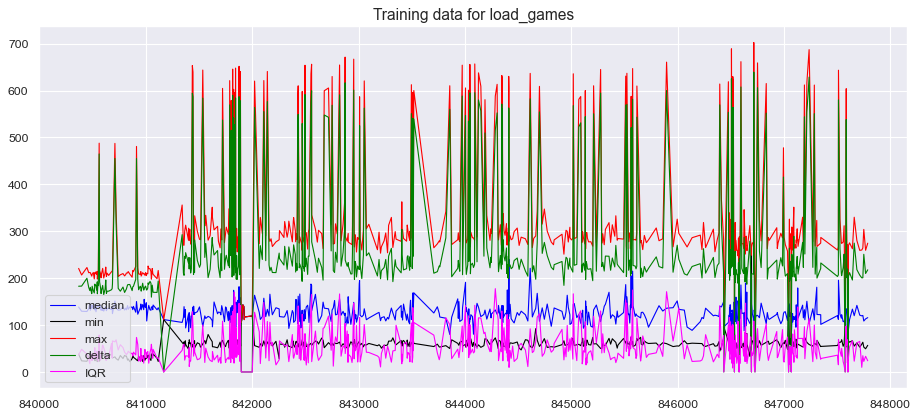

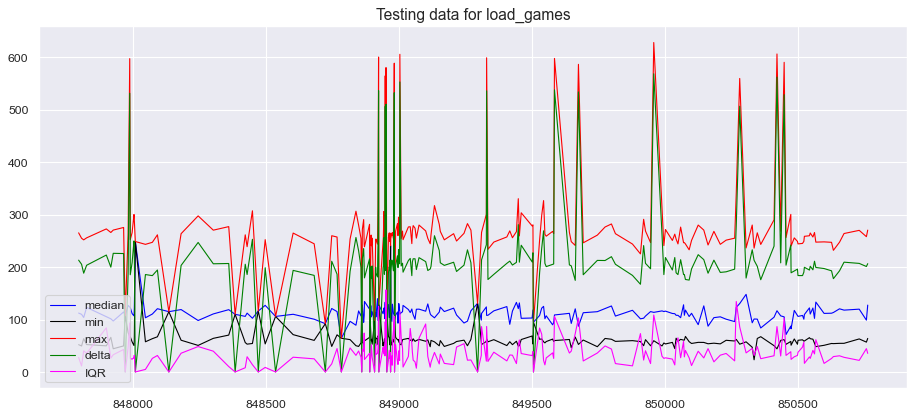

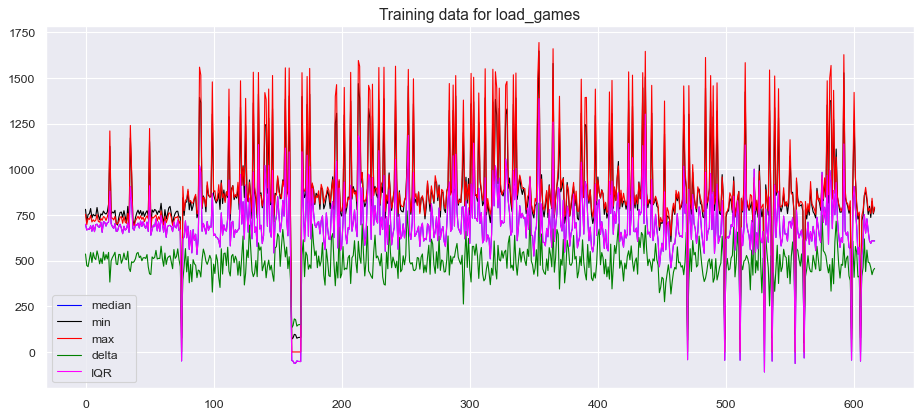

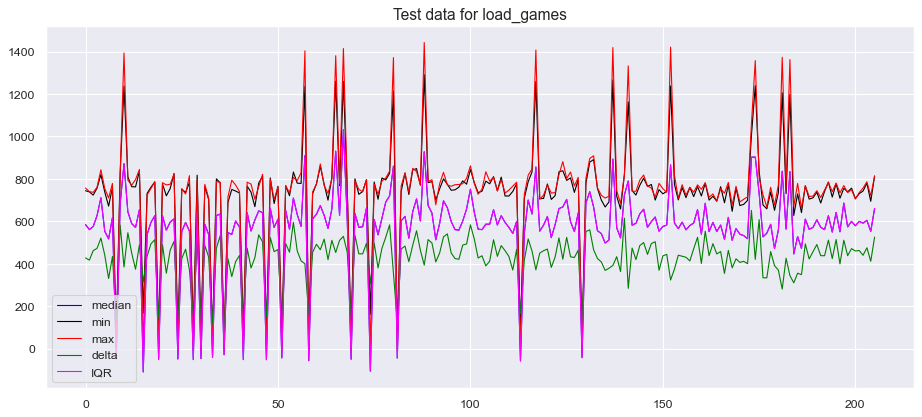

training data shape for load_games (617, 1, 9)
test data shape for load_games (206, 1, 9)
Model: "model_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_60 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_236 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_237 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_59 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_238 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_239 (LSTM)              (None, 1, 16)             1344      
__________________________________

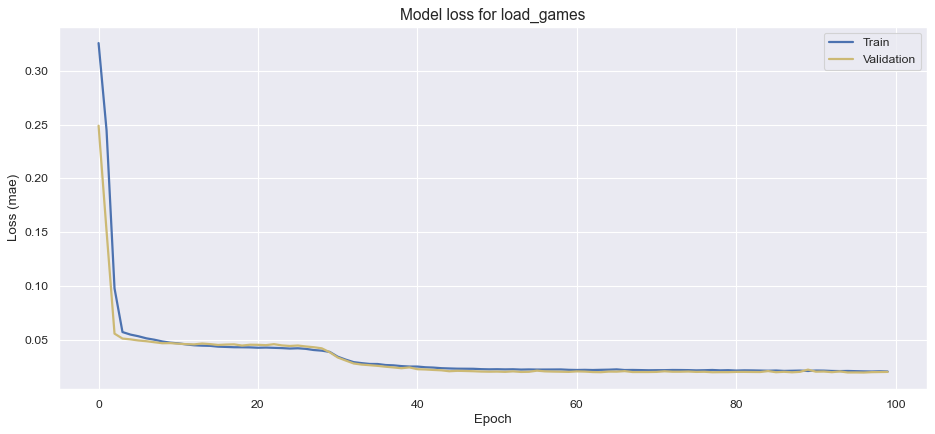

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_games 05/02/2021 14:59:44.h5 saved


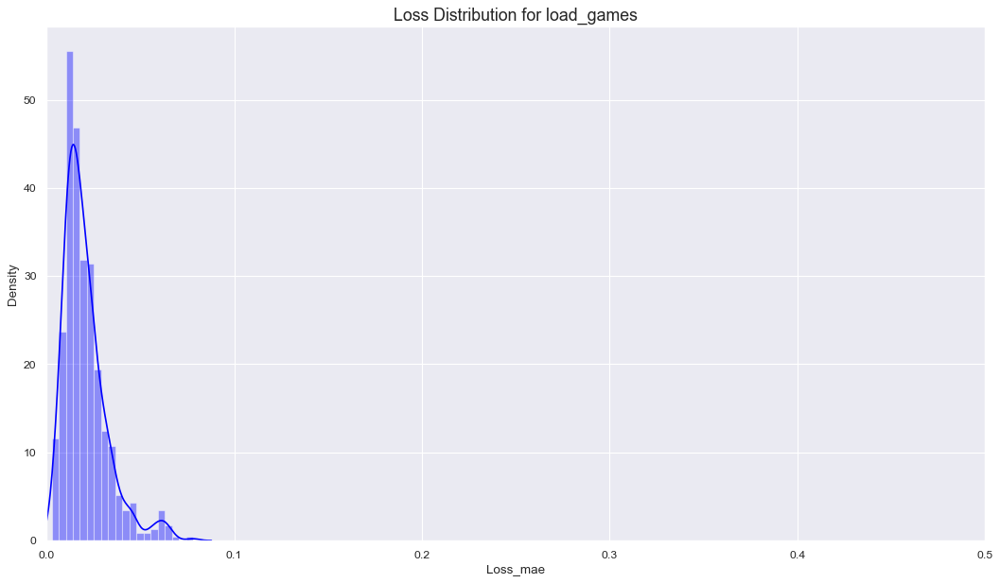

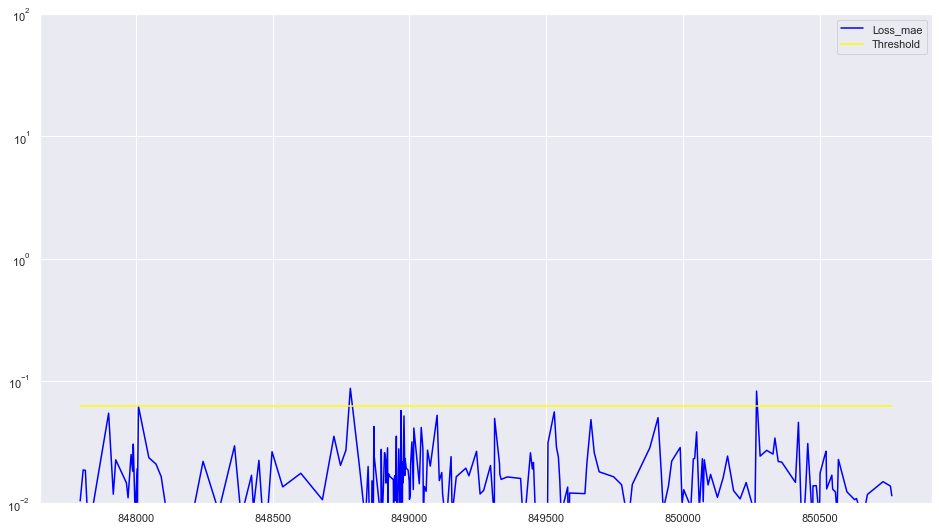

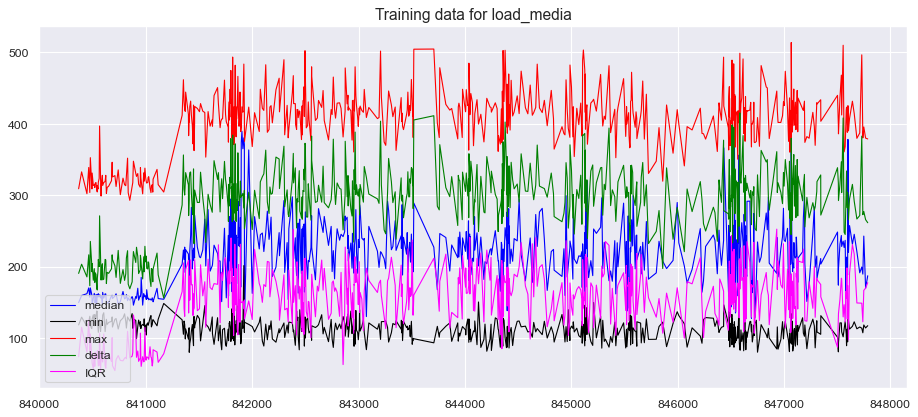

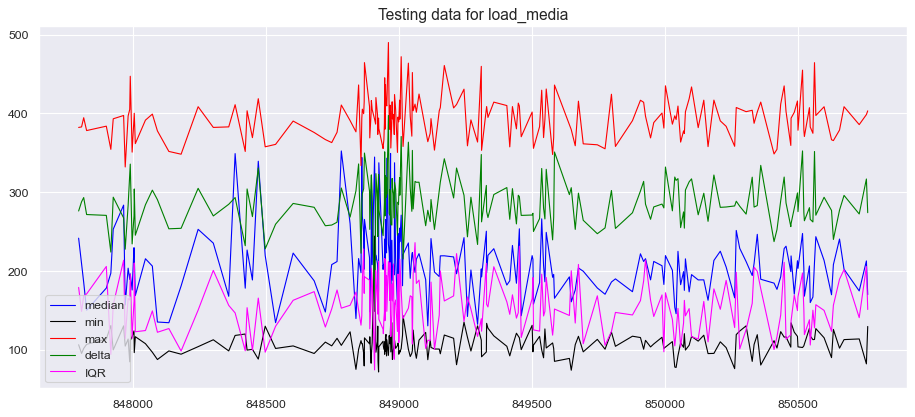

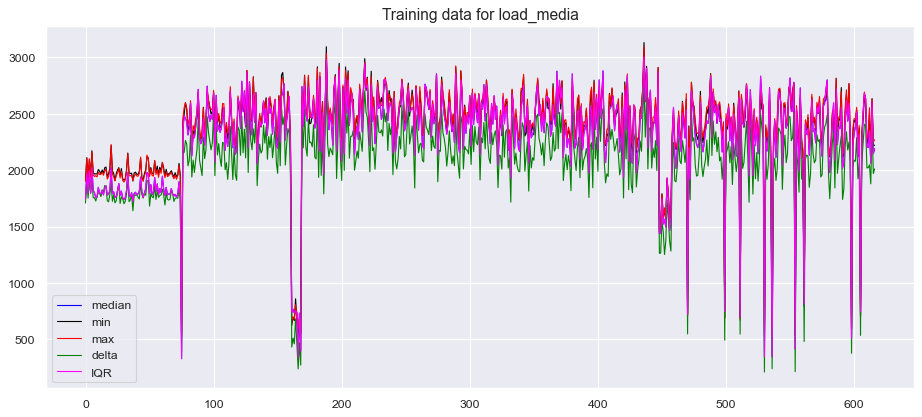

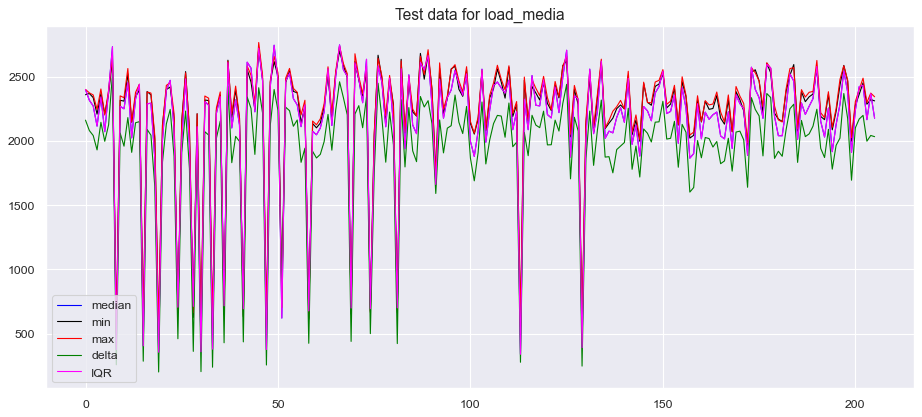

training data shape for load_media (617, 1, 9)
test data shape for load_media (206, 1, 9)
Model: "model_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_61 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_240 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_241 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_60 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_242 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_243 (LSTM)              (None, 1, 16)             1344      
__________________________________

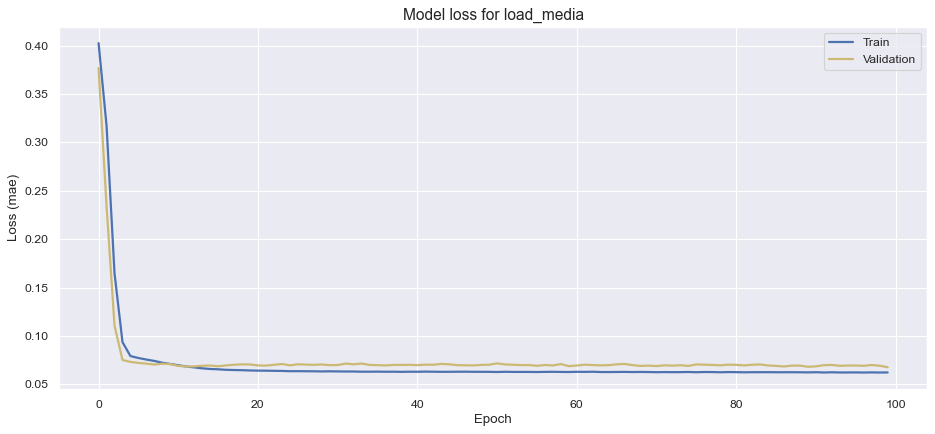

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_media 05/02/2021 15:00:12.h5 saved


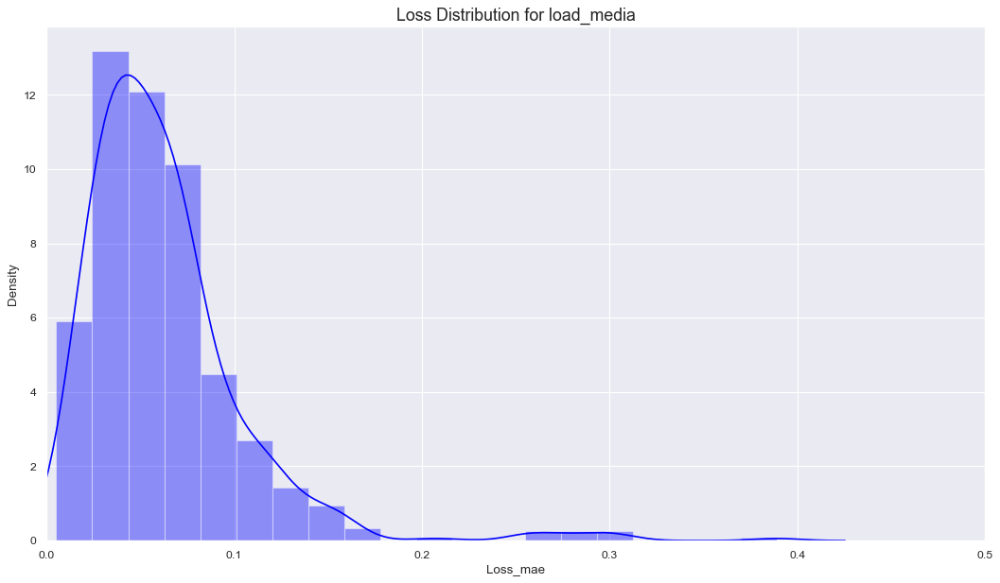

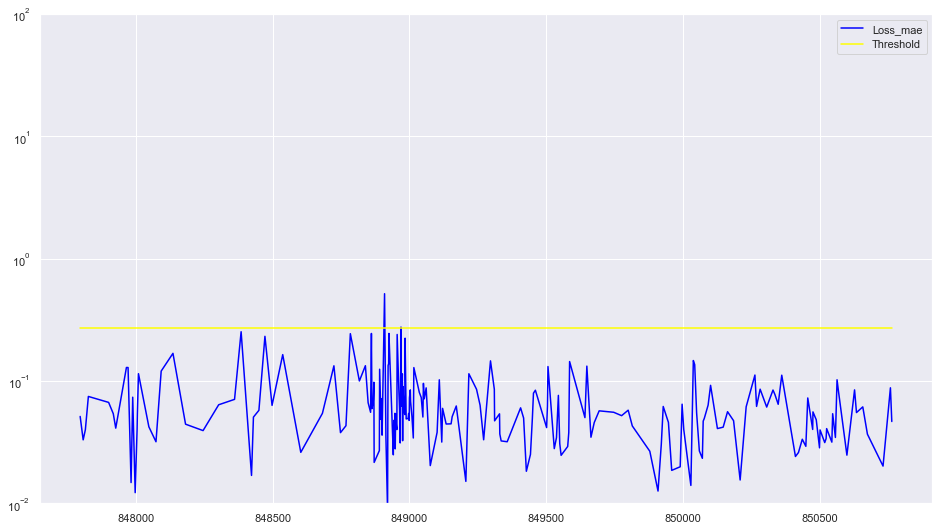

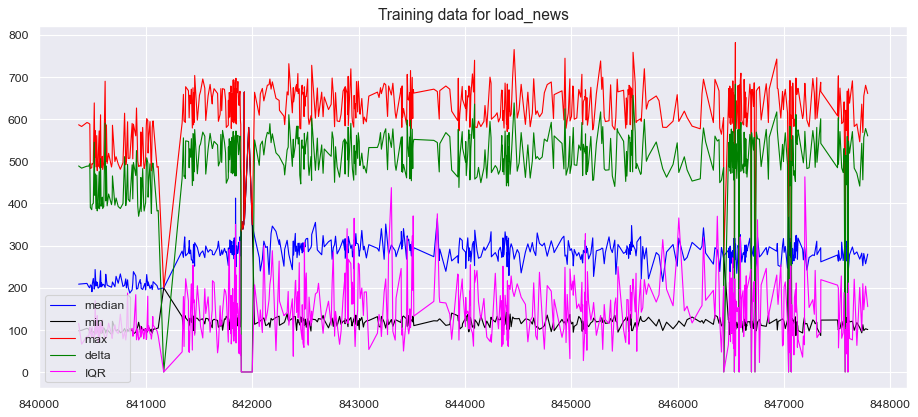

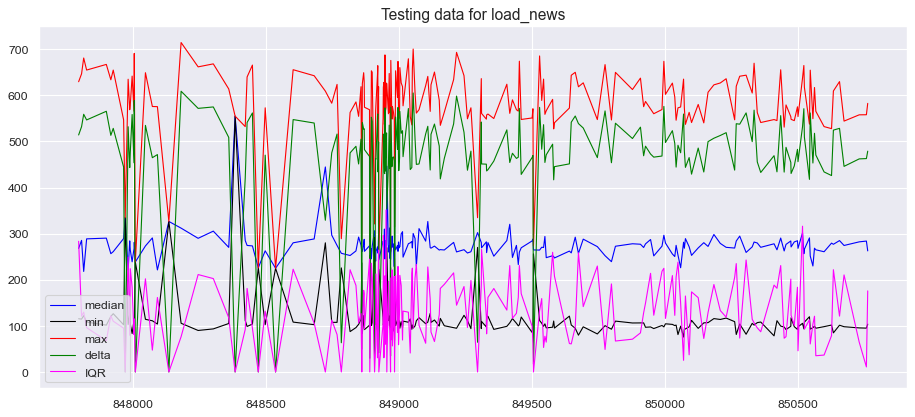

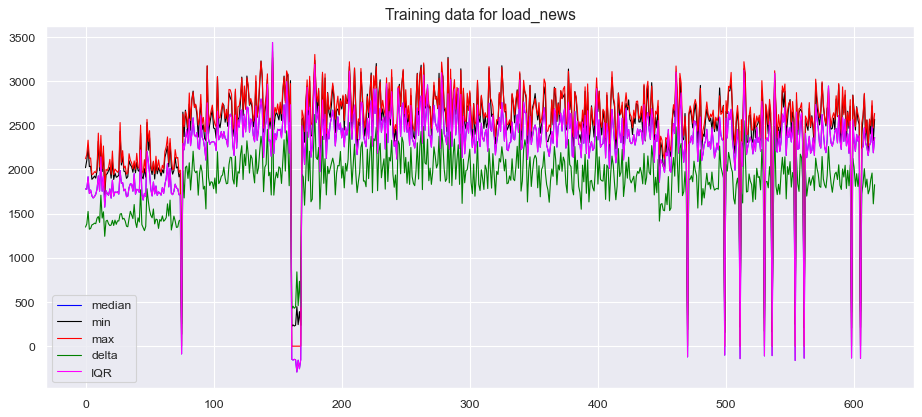

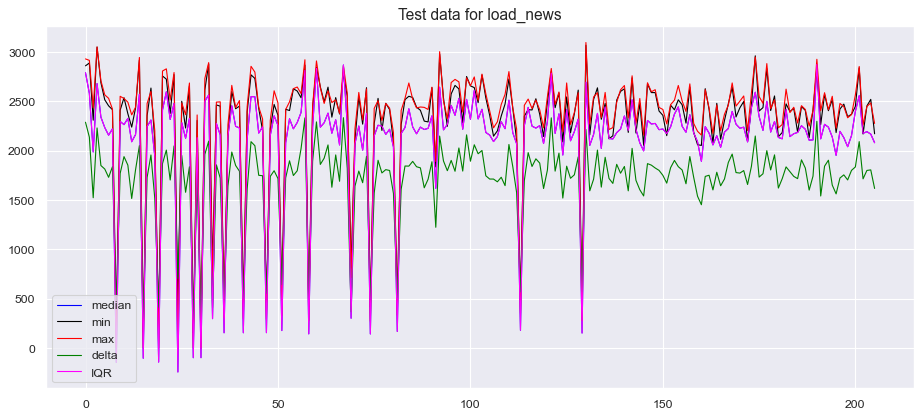

training data shape for load_news (617, 1, 9)
test data shape for load_news (206, 1, 9)
Model: "model_61"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_62 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_244 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_245 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_61 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_246 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_247 (LSTM)              (None, 1, 16)             1344      
____________________________________

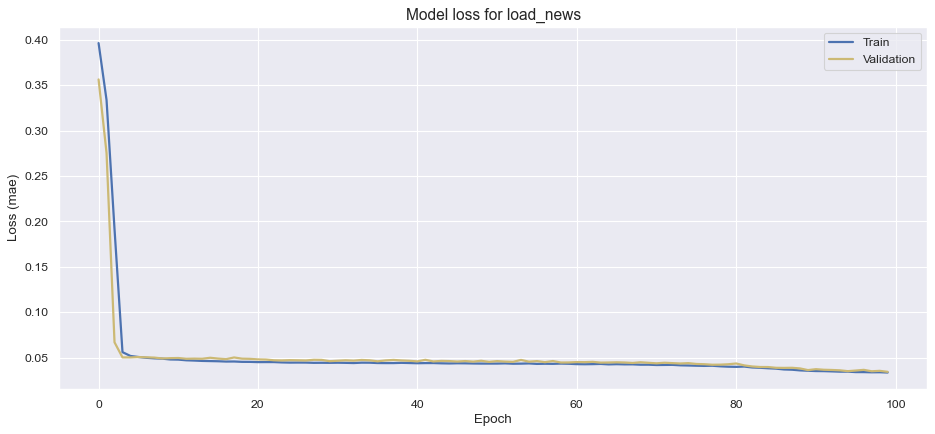

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_news 05/02/2021 15:00:40.h5 saved


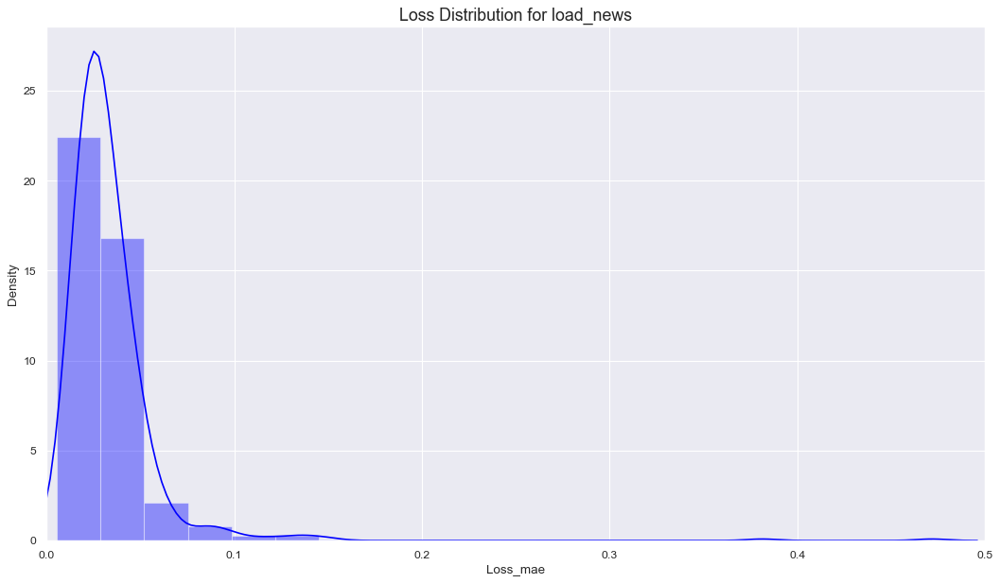

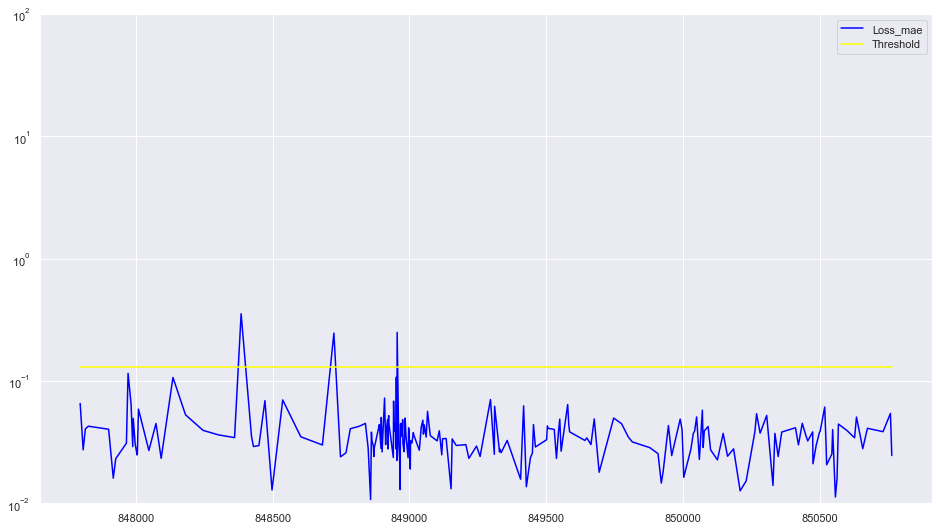

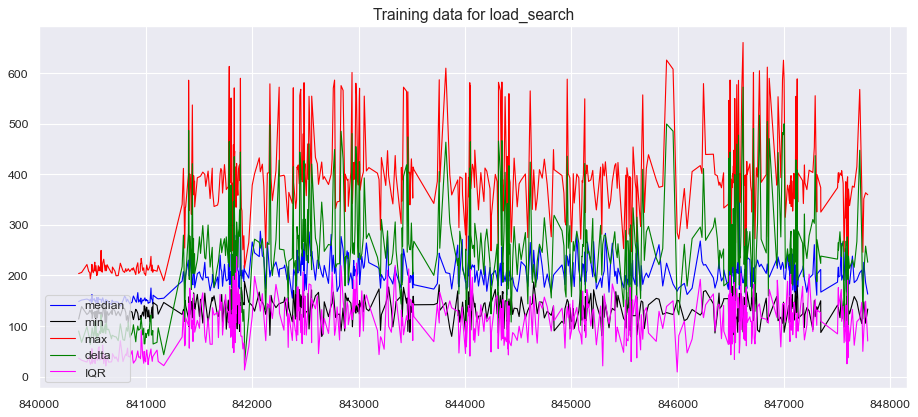

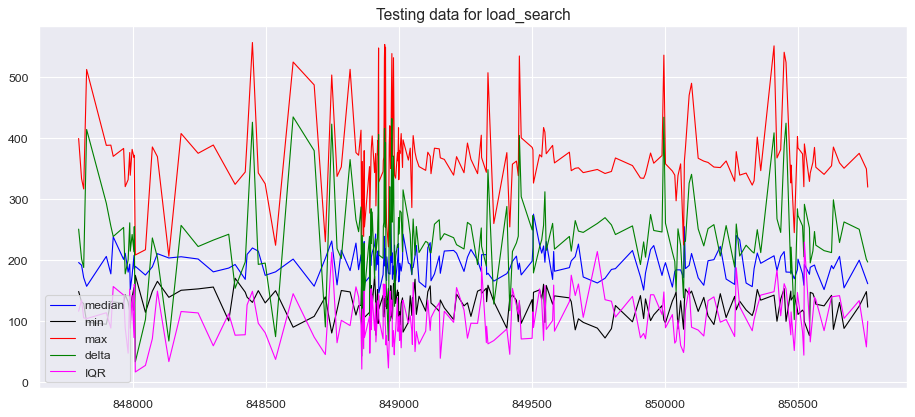

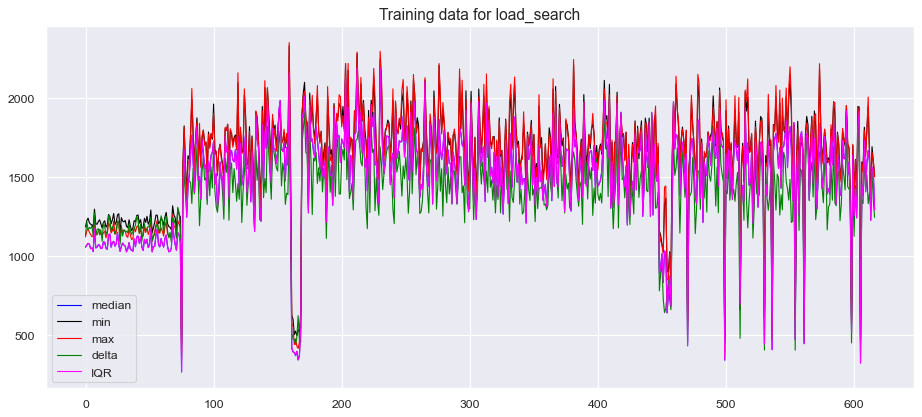

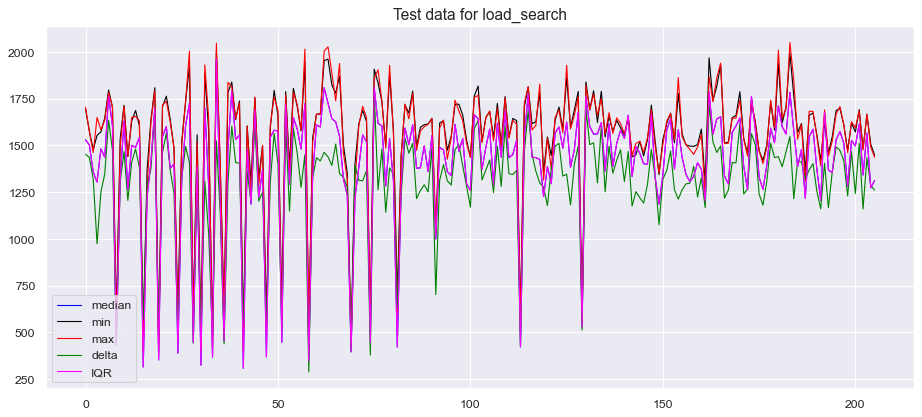

training data shape for load_search (617, 1, 9)
test data shape for load_search (206, 1, 9)
Model: "model_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_63 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_248 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_249 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_62 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_250 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_251 (LSTM)              (None, 1, 16)             1344      
________________________________

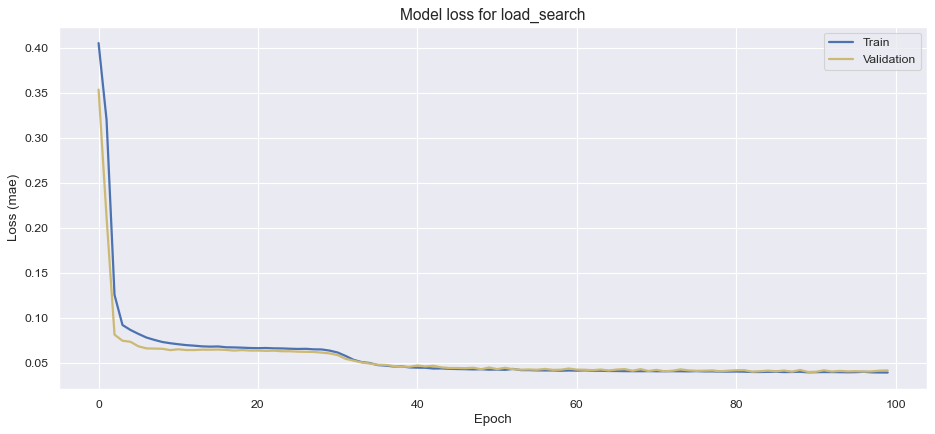

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_search 05/02/2021 15:01:04.h5 saved


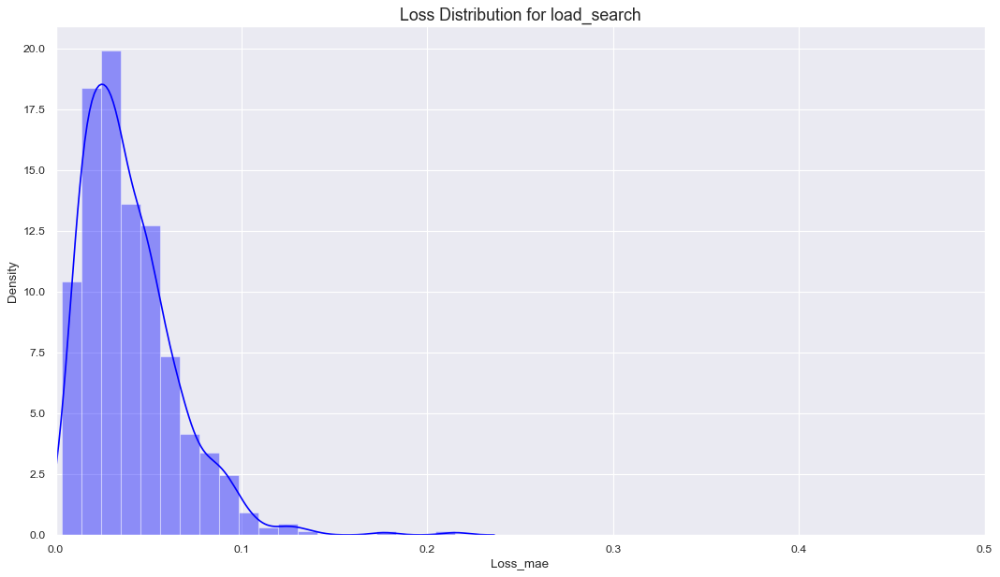

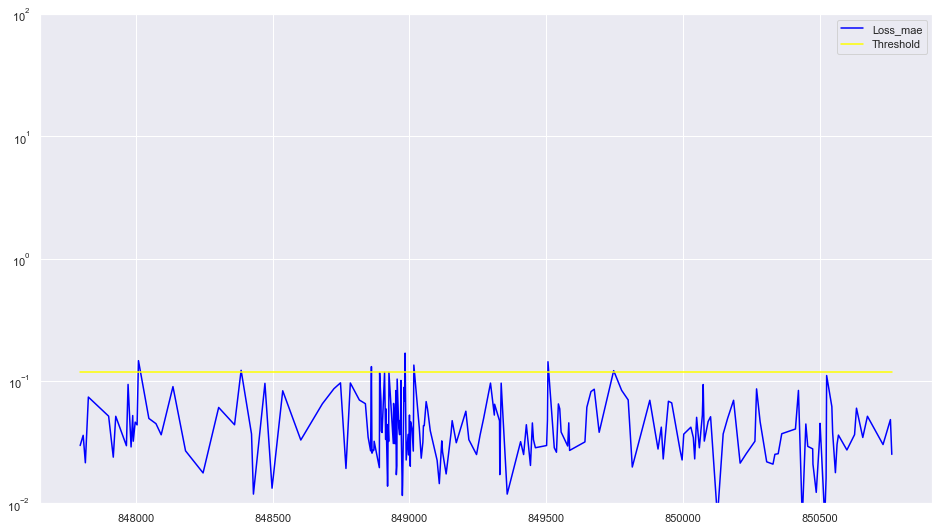

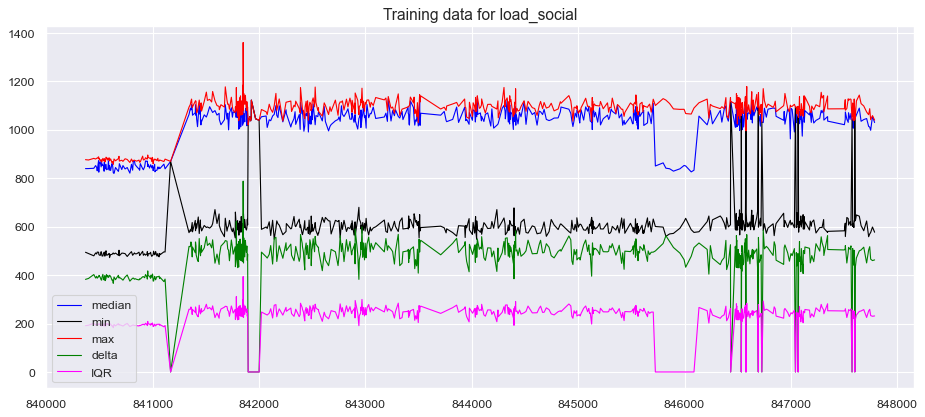

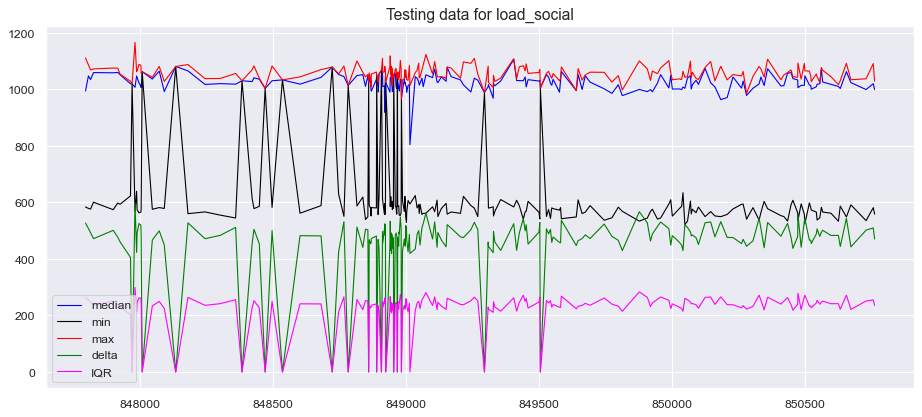

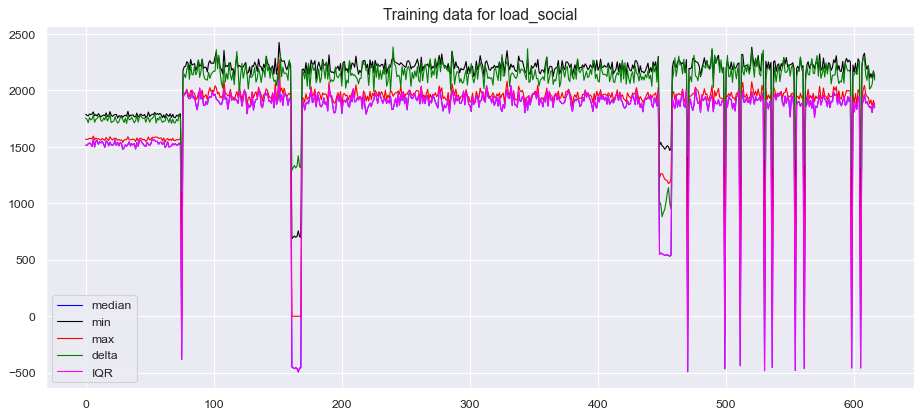

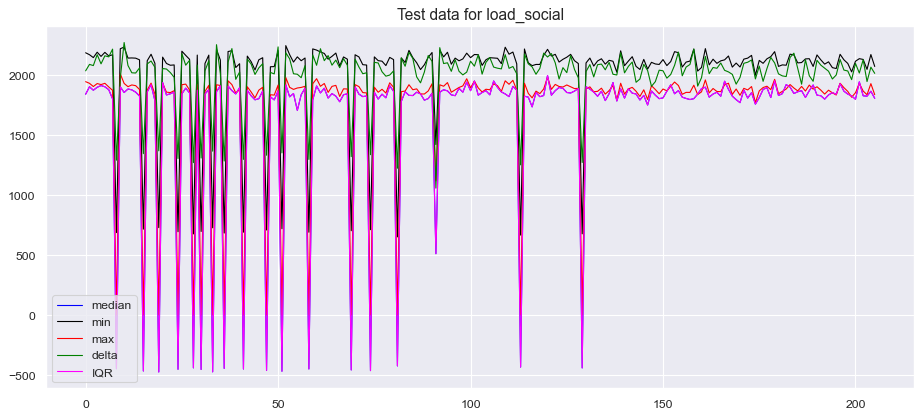

training data shape for load_social (617, 1, 9)
test data shape for load_social (206, 1, 9)
Model: "model_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_64 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_252 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_253 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_63 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_254 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_255 (LSTM)              (None, 1, 16)             1344      
________________________________

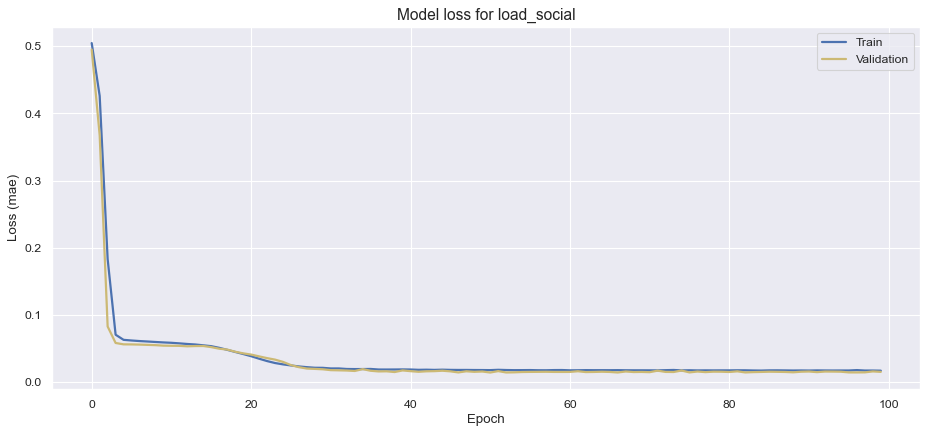

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_social 05/02/2021 15:01:29.h5 saved


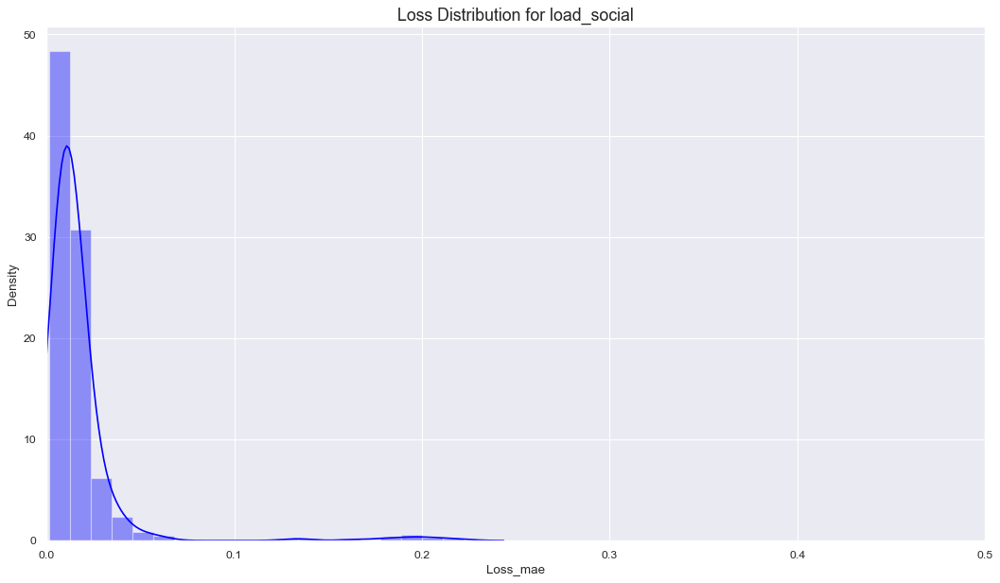

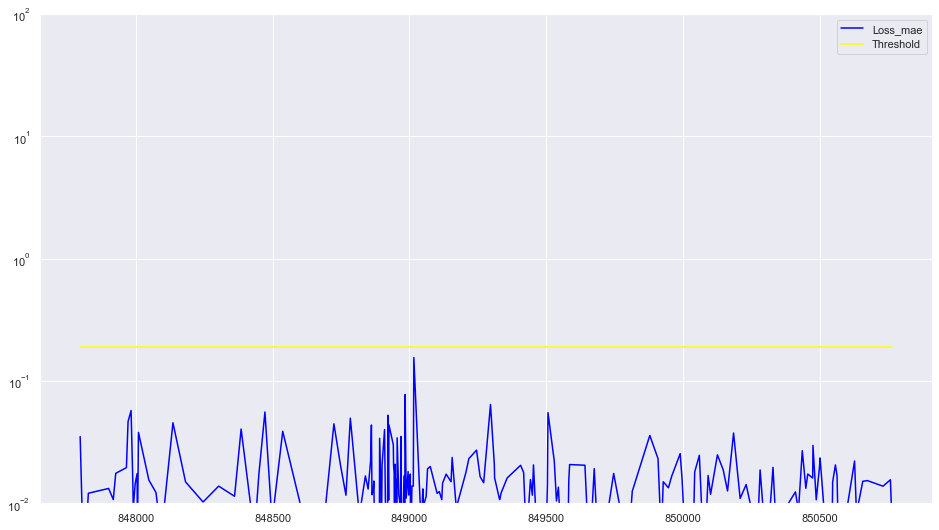

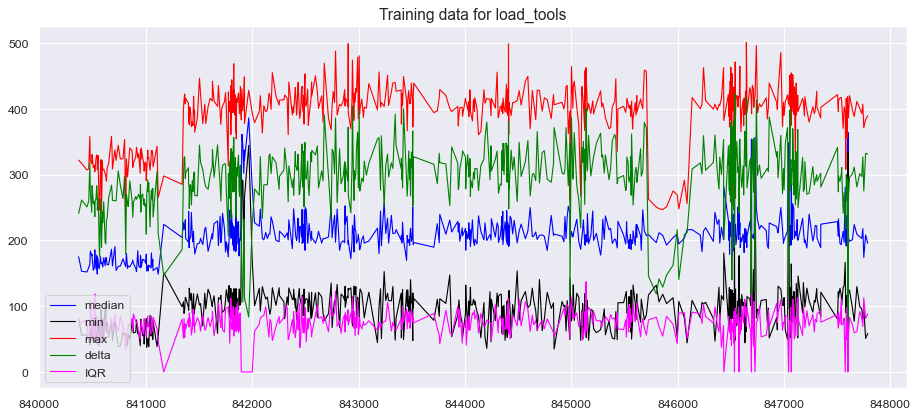

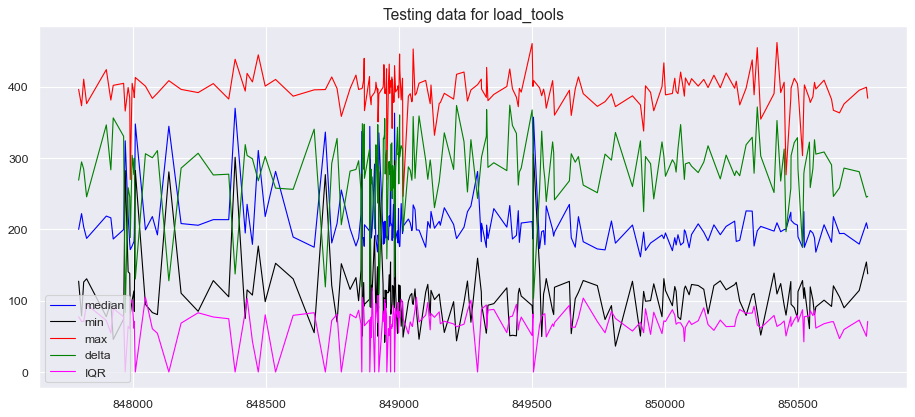

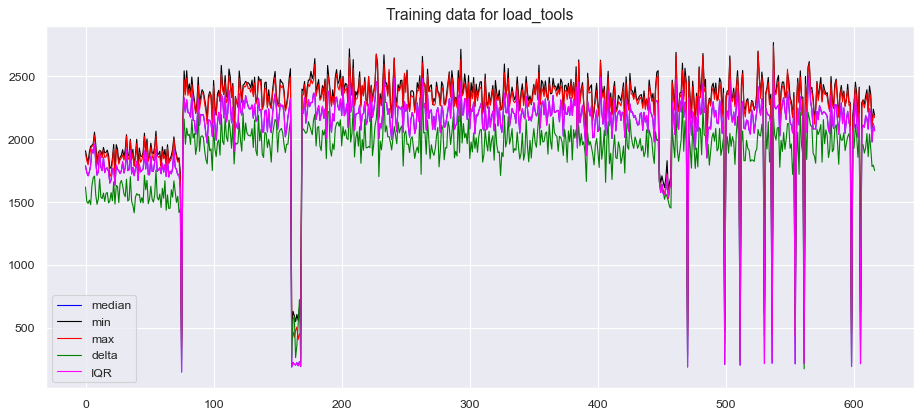

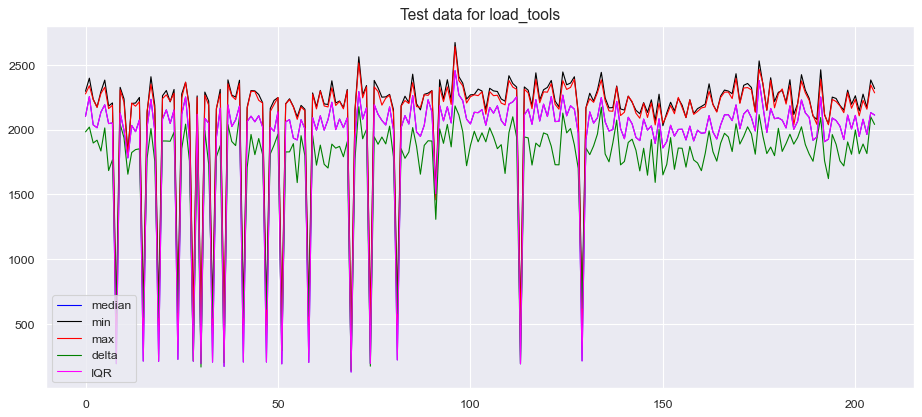

training data shape for load_tools (617, 1, 9)
test data shape for load_tools (206, 1, 9)
Model: "model_64"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_65 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_256 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_257 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_64 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_258 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_259 (LSTM)              (None, 1, 16)             1344      
__________________________________

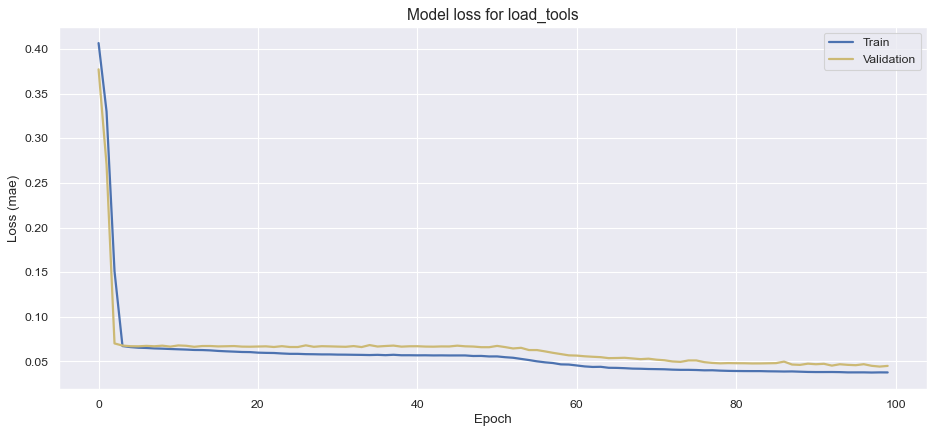

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint load_tools 05/02/2021 15:01:53.h5 saved


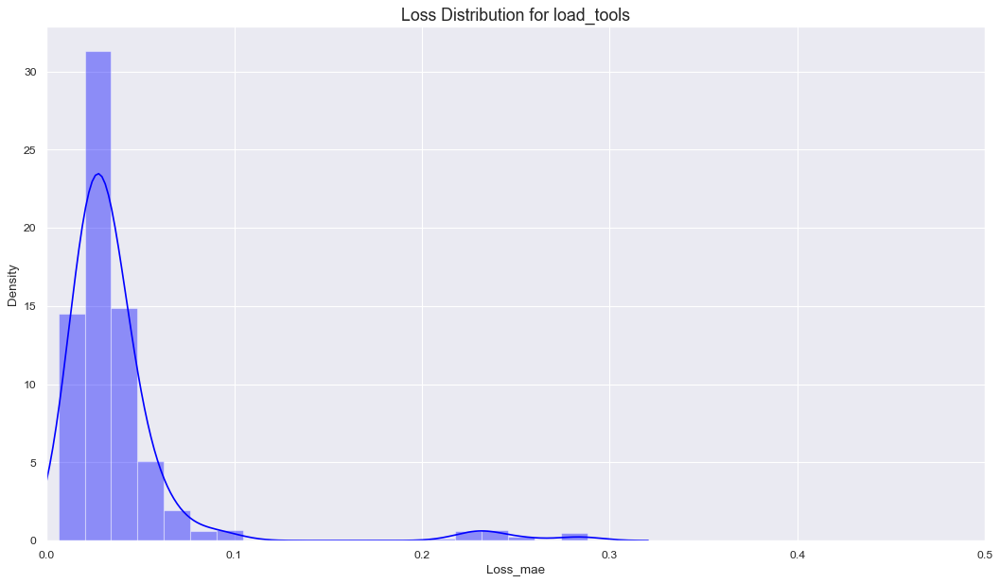

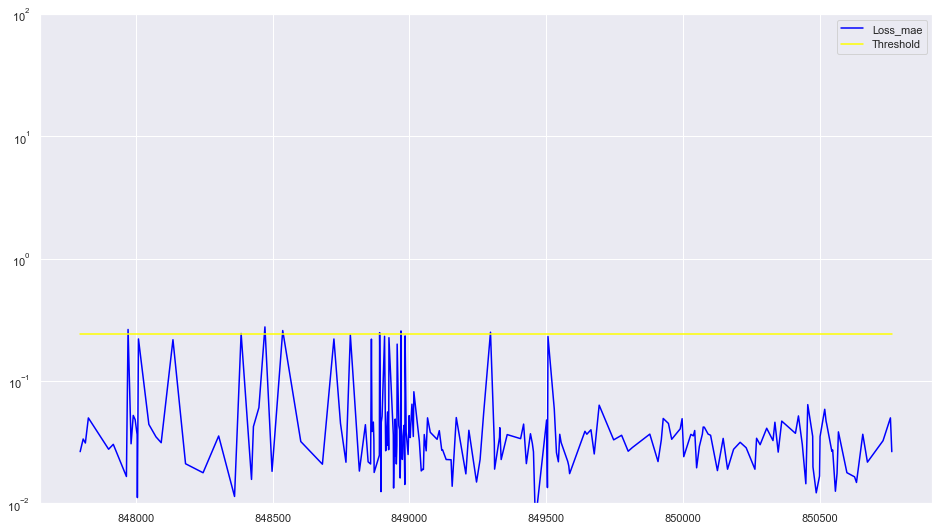

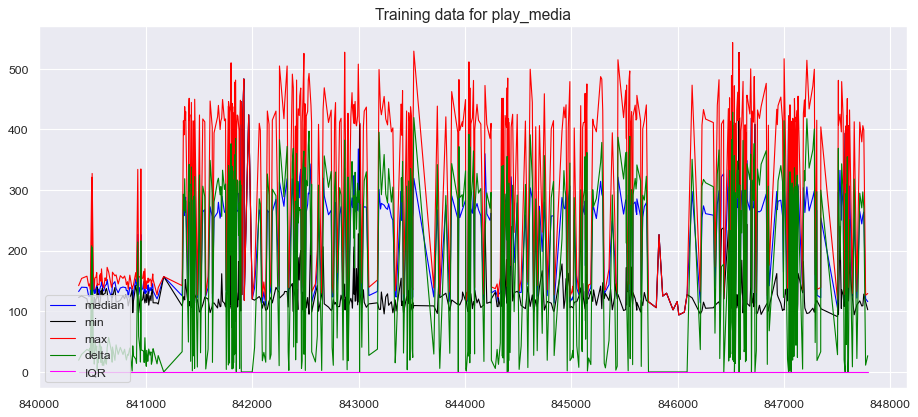

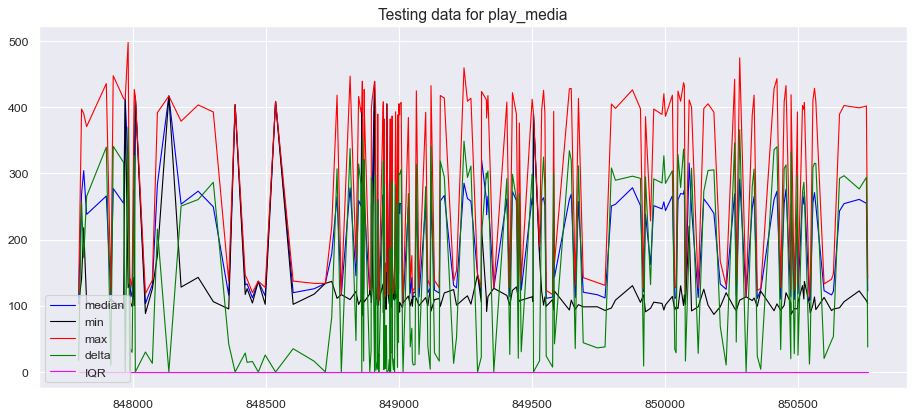

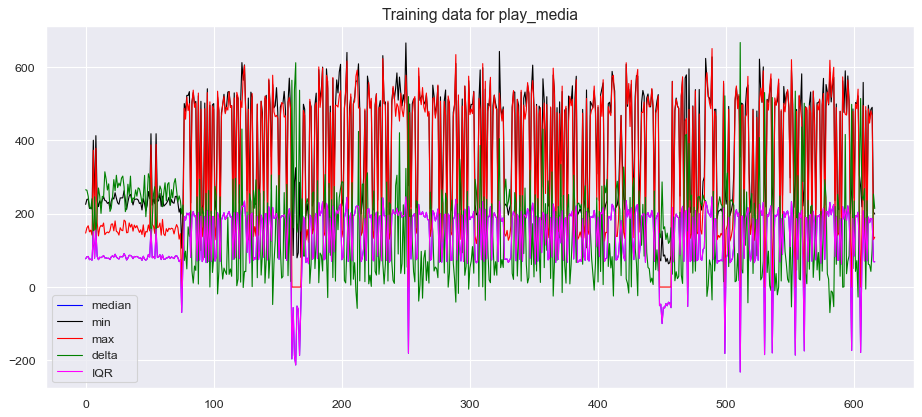

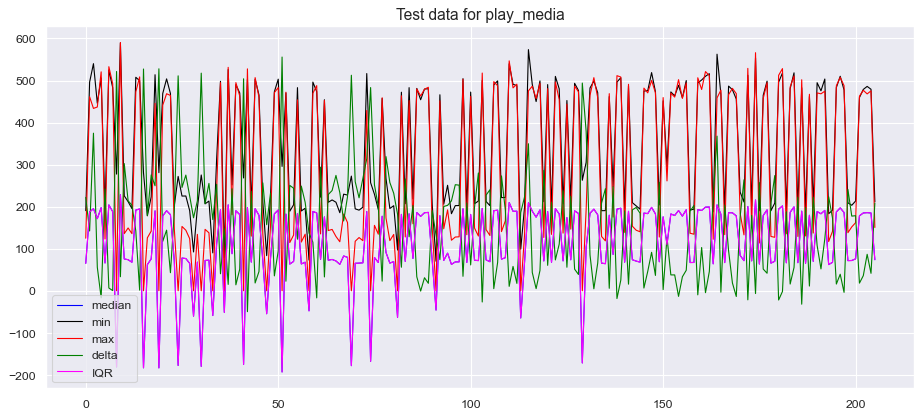

training data shape for play_media (617, 1, 9)
test data shape for play_media (206, 1, 9)
Model: "model_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_66 (InputLayer)        [(None, 1, 9)]            0         
_________________________________________________________________
lstm_260 (LSTM)              (None, 1, 16)             1664      
_________________________________________________________________
lstm_261 (LSTM)              (None, 4)                 336       
_________________________________________________________________
repeat_vector_65 (RepeatVect (None, 1, 4)              0         
_________________________________________________________________
lstm_262 (LSTM)              (None, 1, 4)              144       
_________________________________________________________________
lstm_263 (LSTM)              (None, 1, 16)             1344      
__________________________________

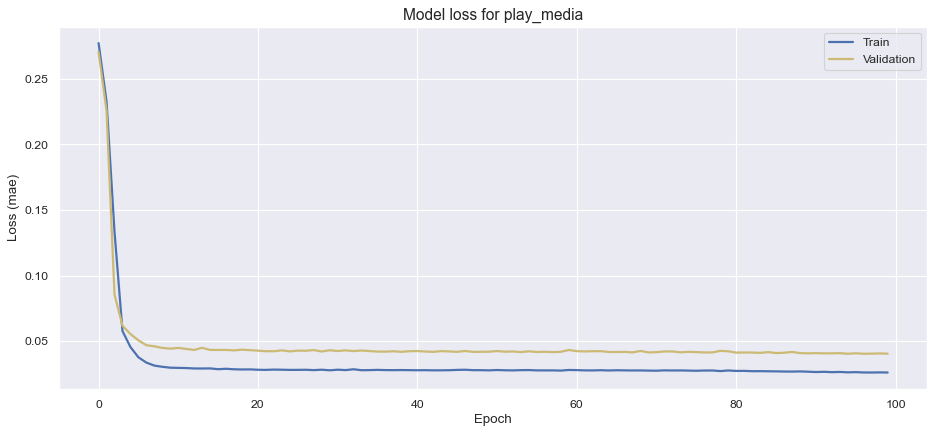

/Users/brianabarker/Library/Python/3.8/lib/python/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


ChromiumPerf linux-perf system_health.common_desktop/timeToFirstPaint play_media 05/02/2021 15:02:16.h5 saved


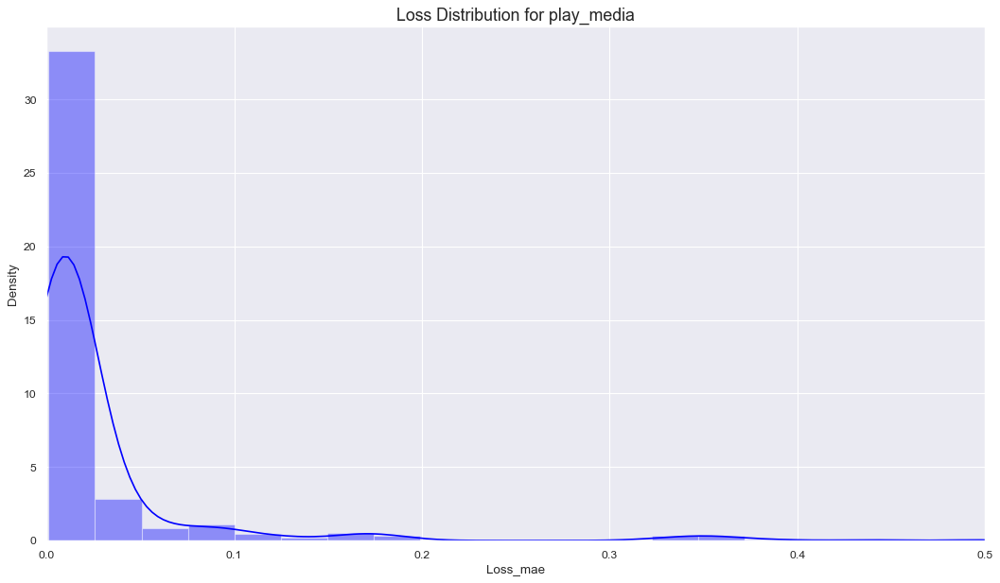

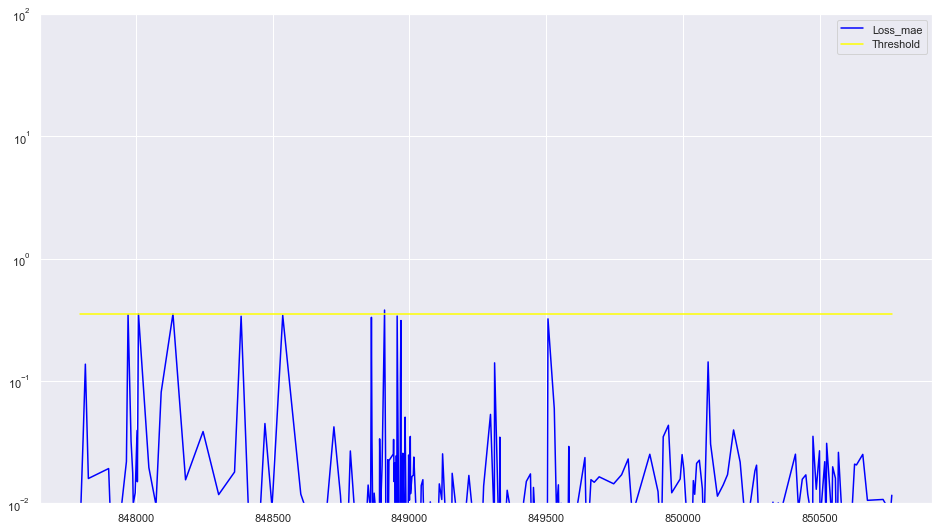

In [118]:
"""
We will create a model for each label so we must loop through each label in the data prepared above.
"""
for label in label_stats: 
    stats = pd.DataFrame.from_dict(label_stats[label]).transpose()
    #training testing split
    rowcount = stats.shape[0]
    training = round(rowcount*0.75)
    training_set = stats.iloc[0:training] #is this an inclusive slice
    testing_set = stats.iloc[training:]
    
    """
    raw data plots
    """
    
    #training data
    fig, ax = plt.subplots(figsize = (14,6),dpi = 80)
    ax.plot(training_set['median'], label = 'median', color = 'blue', animated = True, linewidth = 1)
    ax.plot(training_set['min'], label = 'min', color = 'black', animated = True, linewidth = 1)
    ax.plot(training_set['max'], label = 'max', color = 'red', animated = True, linewidth = 1)
    ax.plot(training_set['delta'], label = 'delta', color = 'green', animated = True, linewidth = 1)
    ax.plot(training_set['IQR'], label = 'IQR', color = 'magenta', animated = True, linewidth = 1)
    plt.legend(loc = 'lower left')
    ax.set_title('Training data for '+ label, fontsize = 14)
    plt.show()
    
    #testing data 
    fig, ax = plt.subplots(figsize = (14,6),dpi = 80)
    ax.plot(testing_set['median'], label = 'median', color = 'blue', animated = True, linewidth = 1)
    ax.plot(testing_set['min'], label = 'min', color = 'black', animated = True, linewidth = 1)
    ax.plot(testing_set['max'], label = 'max', color = 'red', animated = True, linewidth = 1)
    ax.plot(testing_set['delta'], label = 'delta', color = 'green', animated = True, linewidth = 1)
    ax.plot(testing_set['IQR'], label = 'IQR', color = 'magenta', animated = True, linewidth = 1)
    plt.legend(loc = 'lower left')
    ax.set_title('Testing data for ' +label, fontsize = 14)
    plt.show()
    
    #fourier transform
    train_fft_set = np.fft.fft(training_set)
    test_fft_set = np.fft.fft(testing_set)
    
    fig, ax = plt.subplots(figsize = (14,6),dpi = 80)
    ax.plot(train_fft_set[:,1].real, label = 'median', color = 'blue', animated = True, linewidth = 1)
    ax.plot(train_fft_set[:,5].real, label = 'min', color = 'black', animated = True, linewidth = 1)
    ax.plot(train_fft_set[:,6].real, label = 'max', color = 'red', animated = True, linewidth = 1)
    ax.plot(train_fft_set[:,7].real, label = 'delta', color = 'green', animated = True, linewidth = 1)
    ax.plot(train_fft_set[:,8].real, label = 'IQR', color = 'magenta', animated = True, linewidth = 1)
    plt.legend(loc = 'lower left')
    ax.set_title('Training data for '+ label, fontsize = 14)
    plt.show()
    
    fig, ax = plt.subplots(figsize = (14,6),dpi = 80)
    ax.plot(test_fft_set[:,1].real, label = 'median', color = 'blue', animated = True, linewidth = 1)
    ax.plot(test_fft_set[:,5].real, label = 'min', color = 'black', animated = True, linewidth = 1)
    ax.plot(test_fft_set[:,6].real, label = 'max', color = 'red', animated = True, linewidth = 1)
    ax.plot(test_fft_set[:,7].real, label = 'delta', color = 'green', animated = True, linewidth = 1)
    ax.plot(test_fft_set[:,8].real, label = 'IQR', color = 'magenta', animated = True, linewidth = 1)
    plt.legend(loc = 'lower left')
    ax.set_title('Test data for '+ label, fontsize = 14)
    plt.show()


    
    
    """
    To complete the pre-processing of our data, we will first normalize it to a range between 0 and 1.
    Then we reshape our data so that it is in a suitable format to be input into an LSTM network.
    LSTM cells expect a 3 dimensional tensor of the form [data samples, time/revision steps, features].
    Here, each sample input into the LSTM network represents one revision (which acts as one step in time)
    and contains 5 features — the statistics found for the collection of sample values at that revision.

    """
    
    scaler = MinMaxScaler()
    X_train=scaler.fit_transform(training_set)
    X_test= scaler.transform(testing_set)
    scaler_filename = "scaler_data"
    joblib.dump(scaler, scaler_filename)
    
    X_train = X_train.reshape(X_train.shape[0],1,X_train.shape[1])
    print("training data shape for "+ label, X_train.shape)
    X_test = X_test.reshape(X_test.shape[0],1,X_test.shape[1])
    print("test data shape for "+ label, X_test.shape)
    
    
    model = autoencoder_model(X_train)
    model.compile(optimizer = 'adam', loss = 'mae')
    model.summary()
    
    """
    We run the model over 100 epochs. An epoch is one cycle through the full training dataset.
    So in this scenario, we are running the model over the training set 100 times in order to 
    complete the training.
    """
    nb_epochs = 100
    batch_size = 10 
    history = model.fit(X_train, X_train, epochs = nb_epochs, batch_size = batch_size, validation_split = 0.05).history
    
    """
    We plot the losses found in training to evaluate the performance of the model we have built
    """
    fig,ax = plt.subplots(figsize = (14,6),dpi=80)
    ax.plot(history['loss'],'b',label='Train',linewidth=2)
    ax.plot(history['val_loss'],'y',label='Validation',linewidth=2)
    ax.set_title('Model loss for ' + label, fontsize = 14)
    ax.set_ylabel('Loss (mae)')
    ax.set_xlabel('Epoch')
    ax.legend(loc='upper right')
    plt.show()
    
    #loss distribution plot
    X_pred = model.predict(X_train)
    X_pred = X_pred.reshape(X_pred.shape[0],X_pred.shape[2])
    X_pred = pd.DataFrame(X_pred, columns = training_set.columns)
    X_pred.index = training_set.index

    scored = pd.DataFrame(index = training_set.index)
    Xtrain = X_train.reshape(X_train.shape[0],X_train.shape[2])
    scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain),axis = 1)
    plt.figure(figsize = (16,9), dpi = 80)
    plt.title('Loss Distribution for '+ label, fontsize = 16)
    sns.distplot(scored['Loss_mae'],bins = 20, kde = True, color = 'blue');
    plt.xlim([0.0,.5])
    
    sum_stats = scored['Loss_mae'].describe(percentiles=[.9, .95, .99])
    
    """
    The tutorial followed in this notebook suggests that the way to determine the threshold is by
    analysing the loss distribution graph to determine the point at which the loss is negligible. 
    However, we have decided to apply the 99th percentile as the threshold as it seems to provide a 
    more reliable marker for acceptance.
    """
    
    X_pred = model.predict(X_test)
    X_pred = X_pred.reshape(X_pred.shape[0],X_pred.shape[2])
    X_pred = pd.DataFrame(X_pred, columns = testing_set.columns)
    X_pred.index = testing_set.index

    scored = pd.DataFrame(index = testing_set.index)
    Xtest = X_test.reshape(X_test.shape[0],X_test.shape[2])
    scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest),axis = 1)
    scored['Threshold']= sum_stats['99%']
    scored['Anomaly']= scored['Loss_mae']> scored['Threshold']

    scored.plot(logy=True,figsize=(16,9), ylim=[1e-2,1e2], color=['blue','yellow'])
    label_dict = label_stats[label]
    label_dict['model'] = model
    
    # datetime object containing current date and time
    now = datetime.now()
    # dd/mm/YY H:M:S
    dt_string = now.strftime("%d/%m/%Y %H:%M:%S")  

    name = master+ " "+ bot+ " "+ measurement[:-4]+ " " + label + " "+ dt_string + ".h5"
    print(name + " saved")
